# Unsupervised Clustering Analysis

This document presents a complete unsupervised learning pipeline applied to an image dataset.
The objective is to explore the structure of the data, extract meaningful features, apply multiple clustering algorithms, and compare their performance using internal evaluation metrics.

The dataset is organized into class folders, so a ground-truth label is available; we treat the task as **unsupervised during model selection** (only internal metrics drive choices) and use the folder labels only **after the fact** for external validation in the final comparison.


## 1. Imports

All imports are defined once at the top of the document to avoid repetition and ensure reproducibility.


In [ ]:
import os
import glob
import warnings
from collections import Counter
from pathlib import Path

import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from tqdm import tqdm
from PIL import Image

from tensorflow.keras.preprocessing.image import ImageDataGenerator
from tensorflow.keras.applications import ResNet50
from tensorflow.keras.applications.resnet50 import preprocess_input

from sklearn.feature_selection import VarianceThreshold
from sklearn.preprocessing import StandardScaler
from sklearn.decomposition import PCA
from sklearn.cluster import KMeans, AgglomerativeClustering, DBSCAN
from sklearn.manifold import TSNE
from sklearn.neighbors import NearestNeighbors
from sklearn.metrics import (
    silhouette_score,
    calinski_harabasz_score,
    davies_bouldin_score,
    adjusted_rand_score,
    normalized_mutual_info_score,
)

from scipy.cluster.hierarchy import linkage, dendrogram

warnings.filterwarnings("ignore")
sns.set(style="whitegrid")


## 1.1. Global reproducibility setup

All random-number generators used downstream (`numpy`, Python's `random`, `tensorflow`) are seeded from a single `RANDOM_STATE` constant. This makes the entire notebook deterministic given the same dataset and library versions.


In [ ]:
import random

RANDOM_STATE = 42
random.seed(RANDOM_STATE)
np.random.seed(RANDOM_STATE)

try:
    import tensorflow as tf
    tf.random.set_seed(RANDOM_STATE)
except Exception:
    pass

print("Global RANDOM_STATE =", RANDOM_STATE)


Global RANDOM_STATE = 42


In [ ]:
os.makedirs("images", exist_ok=True)

## 2. Mount Drive and locate the dataset

We ensure the dataset is accessible and define paths used throughout the document.


In [ ]:
import sys

IN_COLAB = "google.colab" in sys.modules

if IN_COLAB:
    from google.colab import drive
    drive.mount("/content/drive")
    ZIP_PATH = "/content/drive/MyDrive/patternmind_dataset.zip"
    UNZIP_DIR = "/content/patternmind_unzipped"
else:
    ZIP_PATH = os.environ.get("PATTERNMIND_ZIP", "patternmind_dataset.zip")
    UNZIP_DIR = os.environ.get("PATTERNMIND_UNZIP_DIR", "./patternmind_unzipped")

DATASET_DIR_NAME = "patternmind_dataset"
DATA_ROOT = os.path.join(UNZIP_DIR, DATASET_DIR_NAME)
print("Will use DATA_ROOT:", DATA_ROOT)

if not os.path.isdir(DATA_ROOT):
    os.makedirs(UNZIP_DIR, exist_ok=True)
    if os.path.isfile(ZIP_PATH):
        !unzip -q "{ZIP_PATH}" -d "{UNZIP_DIR}"
        print("Unzipped dataset.")
    else:
        raise FileNotFoundError(
            f"Dataset zip not found at {ZIP_PATH}. "
            "Set PATTERNMIND_ZIP or PATTERNMIND_UNZIP_DIR, or place the zip next to the notebook."
        )
else:
    print("Dataset already unzipped.")

print("DATA_ROOT exists:", os.path.isdir(DATA_ROOT))
print("Contents of UNZIP_DIR:", os.listdir(UNZIP_DIR))


Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).
Will use DATA_ROOT: /content/patternmind_unzipped/patternmind_dataset
Dataset already unzipped.
DATA_ROOT exists: True
Contents of UNZIP_DIR: ['__MACOSX', 'patternmind_dataset']


We list the contents of the extracted directory to verify that the dataset has been correctly unzipped.

The output confirms that `DATA_ROOT` exists and that the extraction was successful. In addition to the dataset folder, a system directory named `__MACOSX` is present. This folder is automatically created when ZIP archives are generated on macOS and does not contain any relevant data for the project. It can safely be ignored in the following steps.

## 3. Exploratory data analysis

We begin by exploring the dataset to understand its structure, size, and basic statistical properties.  
Since the data is unlabeled, EDA is essential to identify patterns, distributions, and potential anomalies that may influence clustering performance.

This section includes:
- Inspecting the number of observations and feature dimensions
- Analyzing feature distributions
- Visualizing sample data where applicable

The insights obtained here guide subsequent preprocessing and modeling choices.


## 3.1. Load dataset and basic information

In this step, we load the dataset from the extracted directory and inspect its basic structure to gain an initial understanding of its organization.

Specifically, we examine:
- the total number of images
- the folder-based image structure
- any available labels (if present)
- the overall dataset organization

The dataset is organized into subdirectories, each corresponding to a distinct class. By listing these folders, we can verify how many classes are available and inspect a sample of class names. This information is useful for understanding the scale of the dataset and for guiding subsequent preprocessing and analysis steps.


In [ ]:
root = DATA_ROOT

folders = [d for d in os.listdir(root)
                 if os.path.isdir(os.path.join(root, d))]

print("Number of class folders:", len(folders))
print("First 20 class folders:", folders[:20])

Number of class folders: 233
First 20 class folders: ['cd', 'hourglass', 'coffin', 'teepee', 'clutter', 'paperclip', 'fern', 'bat', 'segway', 'hot-dog', 'hibiscus', 'desk-globe', 'ak47', 'greyhound', 'harp', 'camel', 'duck', 'pyramid', 'dice', 'teapot']


## 3.2. Collect all image paths

In this step, we recursively scan the dataset directory to collect the file paths of all images contained in the dataset.

We restrict the search to common image formats to ensure consistency across the project. The supported file extensions are:
- `.jpg`
- `.jpeg`
- `.png`

By traversing the directory structure and aggregating all matching file paths, we obtain the complete list of images that will be used throughout the document. This list serves as a central reference for subsequent processing steps such as visualization, feature extraction, and clustering.


In [ ]:
DATA_DIR = UNZIP_DIR
extensions = ['*.jpg', '*.jpeg', '*.png']
image_paths = []

for ext in extensions:
    image_paths.extend(glob.glob(os.path.join(DATA_DIR, '**', ext), recursive=True))

print("Total images found:", len(image_paths))
image_paths[:5]

Total images found: 25557


['/content/patternmind_unzipped/patternmind_dataset/cd/cd_25.jpg',
 '/content/patternmind_unzipped/patternmind_dataset/cd/cd_85.jpg',
 '/content/patternmind_unzipped/patternmind_dataset/cd/cd_29.jpg',
 '/content/patternmind_unzipped/patternmind_dataset/cd/cd_36.jpg',
 '/content/patternmind_unzipped/patternmind_dataset/cd/cd_43.jpg']

## 3.3. Extract class labels from folder structure

Each image in the dataset is stored inside a directory corresponding to its class label. We leverage this folder-based organization to automatically extract class labels from the file paths.

For each image path, the label is obtained from the name of its parent directory. This approach allows us to infer labels without relying on an external annotation file.

Using this information, we construct a structured DataFrame containing:
- `path`: the full file path of each image  
- `label`: the class label derived from the folder name  

This representation enables us to verify the dataset organization and compute useful statistics such as:
- class distribution  
- total number of images per class  
- detection of empty or missing class folders  

These checks provide an important sanity check before proceeding with further analysis and feature extraction.


In [ ]:
def get_class_from_path(path):
    return os.path.basename(os.path.dirname(path))

labels = [get_class_from_path(p) for p in image_paths]

df = pd.DataFrame({
    "path": image_paths,
    "label": labels
})

df.head()

,path,label
0,/content/patternmind_unzipped/patternmind_data...,cd
1,/content/patternmind_unzipped/patternmind_data...,cd
2,/content/patternmind_unzipped/patternmind_data...,cd
3,/content/patternmind_unzipped/patternmind_data...,cd
4,/content/patternmind_unzipped/patternmind_data...,cd


## 3.4. Class distribution

In this step, we analyze how images are distributed across the different classes in the dataset by counting how many images appear in each class folder.

This analysis helps identify potential issues such as:
- class imbalance, where some classes contain significantly more images than others  
- empty class folders with no associated images  
- incorrectly named or unexpected folders  

By computing and inspecting the class distribution, we gain a clearer understanding of the dataset composition. This information is particularly important for guiding downstream tasks, such as sampling strategies, feature extraction, and the interpretation of clustering results.


In [ ]:
class_counts = df["label"].value_counts().sort_values(ascending=False)

print("Number of classes:", len(class_counts))
class_counts.head(10)

Number of classes: 233


,count
label,
clutter,761
airplanes,720
motorbikes,719
faces-easy,396
t-shirt,330
hammock,257
billiards,251
horse,246
ladder,223


The histogram below shows the distribution of the number of images per class in the dataset.

Most classes contain a relatively small number of images, while a few classes have significantly more samples. This indicates a noticeable class imbalance, which is common in large-scale, real-world image datasets.

Understanding this distribution is important, as class imbalance can influence downstream tasks such as clustering quality and the interpretation of learned feature representations. In later stages, this insight can guide decisions related to sampling strategies or evaluation of results.

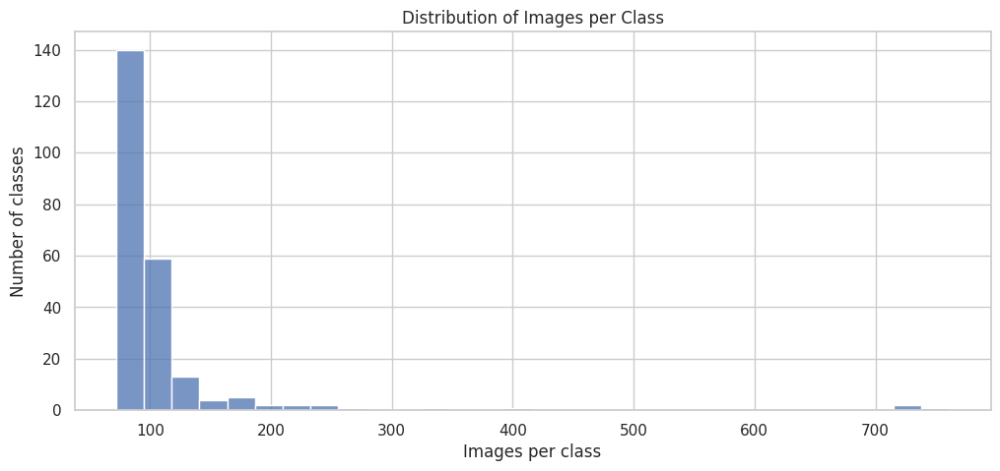

In [ ]:
plt.figure(figsize=(12, 5))
sns.histplot(class_counts, bins=30)
plt.title("Distribution of Images per Class")
plt.xlabel("Images per class")
plt.ylabel("Number of classes")
plt.show()

## 3.5. Checking for empty folders, duplicates, and corrupted images

In this step, we perform a series of data quality checks to ensure that the dataset is clean and consistent before proceeding further.

Specifically, we check for:
- **Empty folders**: class directories that contain zero images  
- **Duplicate filenames**: cases where the same filename appears in multiple class folders, which may indicate duplicated or mislabeled images  
- **Corrupted images**: files that cannot be opened correctly using the PIL library  

These checks help validate the integrity of the dataset and confirm that the folder structure is coherent and complete. Ensuring data quality at this stage reduces the risk of errors and unexpected behavior in downstream processing steps such as feature extraction and clustering.

In [ ]:
folder_counts = {}

for cls in folders:
    cls_path = os.path.join(root, cls)
    images = [f for f in os.listdir(cls_path)
              if os.path.isfile(os.path.join(cls_path, f))]
    folder_counts[cls] = len(images)

print("Total folders:", len(folder_counts))
print("Total images:", sum(folder_counts.values()))


empty_folders = [cls for cls, count in folder_counts.items() if count == 0]
print("Empty folders:", empty_folders if empty_folders else "None")


all_files = []

for cls in folders:
    for file in os.listdir(os.path.join(root, cls)):
        if os.path.isfile(os.path.join(root, cls, file)):
            all_files.append(file)

name_counts = Counter(all_files)
duplicates = [name for name, cnt in name_counts.items() if cnt > 1]

print("Duplicate filenames:", len(duplicates))
print("Examples:", duplicates[:10])


bad_files = []

for path in tqdm(image_paths, desc="Checking corrupted images"):
    try:
        img = Image.open(path)
        img.verify()
    except Exception:
        bad_files.append(path)

print("Corrupted files found:", len(bad_files))

Total folders: 233
Total images: 25558
Empty folders: None
Duplicate filenames: 0
Examples: []


Checking corrupted images: 100%|██████████| 25557/25557 [00:06<00:00, 3732.89it/s]

Corrupted files found: 0


## 3.6. File extensions

In this step, we analyze the distribution of file extensions across the dataset to verify format consistency and detect any unexpected image types.

By computing the frequency of each file extension (e.g., `.jpg`, `.jpeg`, `.png`), we confirm that all images follow a uniform format. This check helps prevent compatibility issues in later stages of the project, such as image loading, preprocessing, and feature extraction.

This analysis also confirms the assumptions made earlier when collecting image paths, validating that the dataset contains only the expected image formats.


In [ ]:
exts = df["path"].apply(lambda x: os.path.splitext(x)[1].lower()).value_counts()
exts

,count
path,
.jpg,25557


## 3.7. Basic dimension statistics (sample of 200 Images)

To understand the variability in image resolutions across the dataset, we randomly select a sample of 200 images and measure their width and height.

For this subset, we compute basic summary statistics such as the mean, median, minimum, and maximum dimensions. Sampling allows us to efficiently estimate resolution characteristics without processing the entire dataset.

This analysis helps verify:
- whether image sizes are relatively consistent across classes  
- whether extreme resolution outliers are present  
- how much resizing or normalization will be required during preprocessing  

Understanding image dimension variability is important for designing downstream processing steps, particularly feature extraction pipelines that require fixed input sizes.

In [ ]:
sample_paths = np.random.choice(image_paths, size=200, replace=False)

widths, heights = [], []

for p in sample_paths:
    try:
        img = Image.open(p)
        w, h = img.size
        widths.append(w)
        heights.append(h)
    except:
        pass

print("Avg width:", np.mean(widths))
print("Avg height:", np.mean(heights))

Avg width: 374.36
Avg height: 319.535


## 3.8. Building a DataFrame for EDA

In this step, we construct a pandas DataFrame that aggregates relevant metadata for each image in the dataset. Centralizing this information in a tabular format simplifies further exploratory analysis and enables efficient computation of summary statistics.

For each image, we store the following attributes:
- `filepath`: full path to the image file  
- `class` (or `label`): class name derived from the parent folder  
- `filename`: basename of the image file  
- `width`, `height`: image dimensions in pixels, read using PIL  
- `extension`: file extension (e.g., `.jpg`, `.png`)  

This DataFrame provides a structured representation of the dataset and allows us to:
- inspect basic statistics across images and classes  
- detect unusual or inconsistent image dimensions  
- verify file format consistency  
- compute class distributions and other aggregate measures  

Having this unified DataFrame is particularly useful for downstream exploratory analysis, visualization, and as a foundation for feature extraction and modeling steps.


In [ ]:
data = {
    "filepath": [],
    "class": [],
    "filename": [],
    "width": [],
    "height": [],
    "extension": []
}

for cls in folders:
    cls_path = os.path.join(root, cls)

    for file in os.listdir(cls_path):
        file_path = os.path.join(cls_path, file)
        if not os.path.isfile(file_path):
            continue

        ext = file.split(".")[-1].lower()

        try:
            img = Image.open(file_path)
            width, height = img.size
        except:
            width, height = None, None

        data["filepath"].append(file_path)
        data["class"].append(cls)
        data["filename"].append(file)
        data["width"].append(width)
        data["height"].append(height)
        data["extension"].append(ext)

df = pd.DataFrame(data)
df.head()

,filepath,class,filename,width,height,extension
0,/content/patternmind_unzipped/patternmind_data...,cd,cd_25.jpg,227.0,208.0,jpg
1,/content/patternmind_unzipped/patternmind_data...,cd,cd_85.jpg,302.0,253.0,jpg
2,/content/patternmind_unzipped/patternmind_data...,cd,cd_29.jpg,650.0,650.0,jpg
3,/content/patternmind_unzipped/patternmind_data...,cd,cd_36.jpg,192.0,192.0,jpg
4,/content/patternmind_unzipped/patternmind_data...,cd,cd_43.jpg,516.0,518.0,jpg


## 3.9. EDA summary plots

In this step, we create simple visual summaries to consolidate insights gathered during the exploratory data analysis phase.

First, we visualize the number of images per class using a bar plot. This representation provides a clear overview of class balance and highlights the presence of class imbalance across the dataset.

In addition, we inspect summary statistics derived from the metadata DataFrame, such as image width and height distributions. These visual and numerical summaries help identify potential anomalies, including extremely small or unusually large images.

Overall, these plots provide a compact visual overview of the dataset and support informed decisions for subsequent preprocessing, feature extraction, and modeling steps.


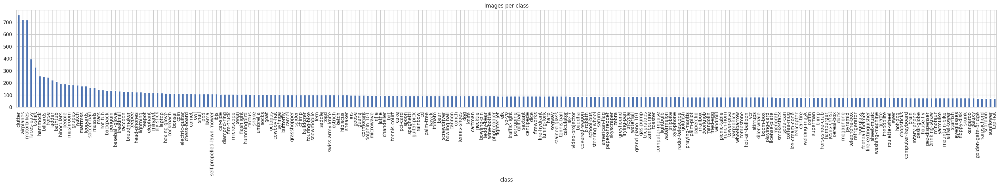

,width,height
count,25557.000000,25557.000000
mean,371.891810,326.044137
std,229.095197,206.907445
min,100.000000,97.000000
25%,238.000000,200.000000
50%,300.000000,280.000000
75%,442.000000,397.000000
max,7913.000000,7913.000000


In [ ]:
df['class'].value_counts().plot(kind='bar', figsize=(40,4))
plt.title("Images per class")
plt.show()

df[['width','height']].describe()

## 3.10. Summary

At the end of the exploratory data analysis, we provide a compact textual summary that consolidates the key characteristics of the dataset.

Specifically, we report:
- the total number of categories (classes)  
- the total number of images  
- the presence or absence of empty class folders  
- the number of corrupted images detected  
- the set of file extensions found in the dataset  

This summary serves as a final validation step, confirming that the dataset is complete, consistent, and free of major quality issues. It also provides a clear reference point before moving on to feature extraction and clustering in the next phase of the project.


# 4. CNN Feature Extraction (ResNet50)

In this section we extract CNN-based feature vectors from the images.  
These features will be used as input for all clustering algorithms.


## 4.1. Collect image paths (sanity check)

Before initializing the data generator, we recursively scan `DATA_ROOT` for image files and **count** them. This acts as a sanity check that the dataset has been correctly located and that all expected image files are accessible.

Note: this is only a **count check**. The authoritative list of image paths used downstream is captured later from `generator.filepaths` (after `flow_from_directory`), because that ordering is guaranteed to match the extracted feature matrix `X` and labels `y`.


In [ ]:
extensions = ['*.jpg', '*.jpeg', '*.png']
_paths_check = []
for ext in extensions:
    _paths_check.extend(glob.glob(os.path.join(DATA_ROOT, '**', ext), recursive=True))

print(f'Found {len(_paths_check)} images on disk (sanity-check count).')
_paths_check[:5]


Found 25557 images on disk (sanity-check count).


['/content/patternmind_unzipped/patternmind_dataset/cd/cd_25.jpg',
 '/content/patternmind_unzipped/patternmind_dataset/cd/cd_85.jpg',
 '/content/patternmind_unzipped/patternmind_dataset/cd/cd_29.jpg',
 '/content/patternmind_unzipped/patternmind_dataset/cd/cd_36.jpg',
 '/content/patternmind_unzipped/patternmind_dataset/cd/cd_43.jpg']

## 4.2. Load images with ImageDataGenerator

In this section, we load images from disk using Keras’ `ImageDataGenerator` and prepare them for feature extraction with the pre-trained ResNet50 model.

We use the `flow_from_directory` interface to stream images directly from `DATA_ROOT` in batches. This approach is memory-efficient and allows us to process large image datasets without loading all images into memory at once.

The generator is configured with the following design choices:
- **Target size**: images are resized to `224 × 224`, which is the input resolution expected by ResNet50.
- **Preprocessing**: ResNet50’s `preprocess_input` function is applied to ensure consistency with the model’s original training setup.
- **Labels**: numeric labels are automatically inferred from the directory structure (`class_mode='sparse'`).
- **Fixed ordering**: `shuffle=False` is explicitly set to preserve the order of images. This is critical to guarantee a correct alignment between image paths, extracted feature vectors, and labels in later stages of the pipeline.

The resulting generator yields batches of preprocessed images that are passed directly to the CNN feature extractor in the next step.


In [ ]:
img_size = (224, 224)
batch_size = 32

datagen = ImageDataGenerator(
    preprocessing_function=preprocess_input
)

generator = datagen.flow_from_directory(
    DATA_ROOT,
    target_size=img_size,
    batch_size=batch_size,
    class_mode='sparse',
    shuffle=False
)

print("Total images:", generator.samples)
print("Number of classes:", generator.num_classes)
print("Class indices (folder -> label):")
print(generator.class_indices)

Found 25557 images belonging to 233 classes.
Total images: 25557
Number of classes: 233
Class indices (folder -> label):
{'airplanes': 0, 'ak47': 1, 'american-flag': 2, 'backpack': 3, 'baseball-glove': 4, 'bat': 5, 'bathtub': 6, 'bear': 7, 'billiards': 8, 'binoculars': 9, 'birdbath': 10, 'blimp': 11, 'bonsai': 12, 'boom-box': 13, 'bowling-ball': 14, 'bowling-pin': 15, 'boxing-glove': 16, 'brain': 17, 'breadmaker': 18, 'buddha': 19, 'bulldozer': 20, 'butterfly': 21, 'cactus': 22, 'cake': 23, 'calculator': 24, 'camel': 25, 'cannon': 26, 'car-side': 27, 'car-tire': 28, 'cartman': 29, 'cd': 30, 'centipede': 31, 'cereal-box': 32, 'chandelier': 33, 'chess-board': 34, 'chimp': 35, 'chopsticks': 36, 'clutter': 37, 'cockroach': 38, 'coffee-mug': 39, 'coffin': 40, 'coin': 41, 'comet': 42, 'computer-keyboard': 43, 'computer-mouse': 44, 'conch': 45, 'cormorant': 46, 'covered-wagon': 47, 'cowboy-hat': 48, 'desk-globe': 49, 'diamond-ring': 50, 'dice': 51, 'dog': 52, 'dolphin-101': 53, 'doorknob': 54

## 4.3. Load pre-trained ResNet50 as a feature extractor

In this section, we load a **ResNet50 model pre-trained on ImageNet** and configure it as a **fixed feature extractor**.

The final classification layers are removed by setting `include_top=False`, allowing us to use the network as a generic feature encoder rather than as a classifier. To obtain a compact and consistent representation for each image, we apply **global average pooling** (`pooling='avg'`), which aggregates spatial information across feature maps.

With this configuration, each input image is mapped to a **2048-dimensional feature vector**, capturing high-level semantic information learned during pre-training.

The model is used **only for inference**, and no weights are updated during this process. This design choice ensures computational efficiency and reproducibility while leveraging powerful representations learned from large-scale visual data.

In [ ]:
feature_extractor = ResNet50(
    weights='imagenet',
    include_top=False,
    pooling='avg',
    input_shape=(224, 224, 3)
)

feature_extractor.summary()

Model: "resnet50"

┏━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)        ┃ Output Shape      ┃    Param # ┃ Connected to      ┃
┡━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━┩
│ input_layer         │ (None, 224, 224,  │          0 │ -                 │
│ (InputLayer)        │ 3)                │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1_pad           │ (None, 230, 230,  │          0 │ input_layer[0][0] │
│ (ZeroPadding2D)     │ 3)                │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1_conv (Conv2D) │ (None, 112, 112,  │      9,472 │ conv1_pad[0][0]   │
│                     │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1_bn            │ (None, 112, 112,  │        256 │ conv1_conv[0][0]  │
│ (BatchNormalizatio… │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1_relu          │ (None, 112, 112,  │          0 │ conv1_bn[0][0]    │
│ (Activation)        │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ pool1_pad           │ (None, 114, 114,  │          0 │ conv1_relu[0][0]  │
│ (ZeroPadding2D)     │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ pool1_pool          │ (None, 56, 56,    │          0 │ pool1_pad[0][0]   │
│ (MaxPooling2D)      │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_1_conv │ (None, 56, 56,    │      4,160 │ pool1_pool[0][0]  │
│ (Conv2D)            │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_1_bn   │ (None, 56, 56,    │        256 │ conv2_block1_1_c… │
│ (BatchNormalizatio… │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_1_relu │ (None, 56, 56,    │          0 │ conv2_block1_1_b… │
│ (Activation)        │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_2_conv │ (None, 56, 56,    │     36,928 │ conv2_block1_1_r… │
│ (Conv2D)            │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_2_bn   │ (None, 56, 56,    │        256 │ conv2_block1_2_c… │
│ (BatchNormalizatio… │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_2_relu │ (None, 56, 56,    │          0 │ conv2_block1_2_b… │
│ (Activation)        │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_0_conv │ (None, 56, 56,    │     16,640 │ pool1_pool[0][0]  │
│ (Conv2D)            │ 256)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_3_conv │ (None, 56, 56,    │     16,640 │ conv2_block1_2_r… │
│ (Conv2D)            │ 256)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_0_bn   │ (None, 56, 56,    │      1,024 │ conv2_block1_0_c… │
│ (BatchNormalizatio… │ 256)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_3_bn   │ (None, 56, 56,    │      1,024 │ conv2_block1_3_c

 Total params: 23,587,712 (89.98 MB)

 Trainable params: 23,534,592 (89.78 MB)

 Non-trainable params: 53,120 (207.50 KB)

## 4.4. Extract feature vectors for all images

In this step, we pass the entire dataset through the pre-trained ResNet50 feature extractor to compute a numerical representation for each image.

Specifically, this process produces:
- **`X`**: a feature matrix of shape `(N_images, 2048)`, where each row corresponds to one image,
- **`y`**: a vector of numeric class labels aligned with the images,
- **`image_paths`**: file paths aligned with `X` and `y` (taken from `generator.filepaths`),
- **`label_names`**: an ordered list mapping label indices to class names.

**Caching.** Feature extraction is the slowest step in the entire notebook. To avoid re-running it on every execution, the cell below first checks whether `X_features.npy`, `y_labels.npy`, `label_names.npy`, and `image_paths.npy` already exist on disk. If they do, the features are loaded directly from cache and ResNet50 inference is skipped. The cache is built once on the first run; every subsequent run is fast.

Because `flow_from_directory` was initialised with `shuffle=False`, the order of images is preserved, which guarantees correct alignment between image paths, features, and labels.


In [ ]:
_prefix = "/content/" if IN_COLAB else ""
CACHE_X     = f"{_prefix}X_features.npy"
CACHE_Y     = f"{_prefix}y_labels.npy"
CACHE_NAMES = f"{_prefix}label_names.npy"
CACHE_PATHS = f"{_prefix}image_paths.npy"

cache_exists = all(os.path.isfile(p) for p in [CACHE_X, CACHE_Y, CACHE_NAMES, CACHE_PATHS])

if cache_exists:
    print("Cached features found — loading from disk (skipping ResNet50 inference).")
    X           = np.load(CACHE_X)
    y           = np.load(CACHE_Y)
    label_names = list(np.load(CACHE_NAMES, allow_pickle=True))
    image_paths = list(np.load(CACHE_PATHS, allow_pickle=True))
    FEATURES_FROM_CACHE = True
else:
    print("No cache found — running ResNet50 feature extraction (this is the slow step).")
    X = feature_extractor.predict(generator, verbose=1)
    y = generator.classes
    image_paths = list(generator.filepaths)
    label_names = list(generator.class_indices.keys())
    FEATURES_FROM_CACHE = False

print("Feature matrix shape X:", X.shape)
print("Labels shape y:", y.shape)
print("Number of label names:", len(label_names))
print("Number of image paths:", len(image_paths))


Cached features found — loading from disk (skipping ResNet50 inference).
Feature matrix shape X: (25557, 2048)
Labels shape y: (25557,)
Number of label names: 233
Number of image paths: 25557


## 4.5. Save feature matrix and labels

In this final step, we persist the outputs of the feature extraction pipeline to disk so they can be reused by downstream notebooks without recomputing CNN features.

The following artifacts are saved in NumPy (`.npy`) format:
- **`X_features.npy`**: the extracted feature matrix of shape `(N_images, 2048)`,
- **`y_labels.npy`**: numeric class labels aligned with the feature matrix,
- **`label_names.npy`**: mapping from label indices to semantic class names,
- **`image_paths.npy`**: the original image file paths corresponding to each feature vector.

Storing these files ensures a clear separation between feature extraction and analysis, improves reproducibility, and significantly reduces computational overhead for subsequent experiments.


In [ ]:
if FEATURES_FROM_CACHE:
    print("Features were loaded from cache — nothing new to save.")
else:
    np.save(CACHE_X, X)
    np.save(CACHE_Y, y)
    np.save(CACHE_NAMES, np.array(label_names))
    np.save(CACHE_PATHS, np.array(image_paths))
    print("Saved cache:", CACHE_X, CACHE_Y, CACHE_NAMES, CACHE_PATHS)

    if IN_COLAB:
        DRIVE_BACKUP = "/content/drive/MyDrive/projectml_colab"
        os.makedirs(DRIVE_BACKUP, exist_ok=True)
        !cp "{CACHE_X}"     "{DRIVE_BACKUP}/X_features.npy"
        !cp "{CACHE_Y}"     "{DRIVE_BACKUP}/y_labels.npy"
        !cp "{CACHE_NAMES}" "{DRIVE_BACKUP}/label_names.npy"
        !cp "{CACHE_PATHS}" "{DRIVE_BACKUP}/image_paths.npy"
        print(f"Mirrored cache to {DRIVE_BACKUP}")


Features were loaded from cache — nothing new to save.


## 4.6. Sanity checks on extracted features

Before concluding the feature extraction pipeline, we perform a set of **sanity checks** to validate the integrity and consistency of the saved outputs. These checks ensure that the extracted features, labels, and metadata are correctly aligned and suitable for downstream analysis.

### 4.6.1. Shape and consistency checks

We reload the saved arrays from disk and verify the following conditions:
- the number of feature vectors matches the number of images processed,
- the dimensionality of each feature vector is correct (2048 for ResNet50 with global average pooling),
- the number of labels matches the number of feature vectors,
- the number of unique labels is consistent with the number of class names.

Successful validation of these conditions confirms that feature extraction and serialization were executed correctly and that the resulting artifacts are safe to use in subsequent clustering and analysis notebooks.


In [ ]:
_prefix = "/content/" if IN_COLAB else ""
X           = np.load(f"{_prefix}X_features.npy")
y           = np.load(f"{_prefix}y_labels.npy")
label_names = np.load(f"{_prefix}label_names.npy", allow_pickle=True)
image_paths = np.load(f"{_prefix}image_paths.npy", allow_pickle=True)

print("X shape:", X.shape)
print("y shape:", y.shape)
print("Number of label names:", len(label_names))
print("Unique labels:", len(np.unique(y)))
print("Number of image paths:", len(image_paths))


X shape: (25557, 2048)
y shape: (25557,)
Number of label names: 233
Unique labels: 233
Number of image paths: 25557


### 4.6.2. Missing values

Although CNN-based feature extractors typically do not produce missing values, we explicitly check for the presence of **NaN entries** in the extracted feature matrix.

This validation step is important because downstream methods such as **PCA** or **clustering algorithms** may fail or behave unpredictably in the presence of missing values. A zero count confirms that all feature values are numerically valid and that the feature matrix is safe to use for subsequent analysis.


In [ ]:
nan_count = np.isnan(X).sum()
print("Number of NaN values in X:", nan_count)

Number of NaN values in X: 0


### 4.6.3 Zero-variance features

We verify whether any feature dimensions have **zero variance** across all images. Features that are constant for every sample do not carry discriminative information and can negatively affect dimensionality reduction or clustering methods.

Although ResNet50 rarely produces constant activations, performing this check ensures that the extracted feature space is informative and well-suited for unsupervised learning tasks. The absence (or minimal presence) of zero-variance features confirms the quality and usefulness of the learned representations.


Number of constant (zero-variance) features: 0


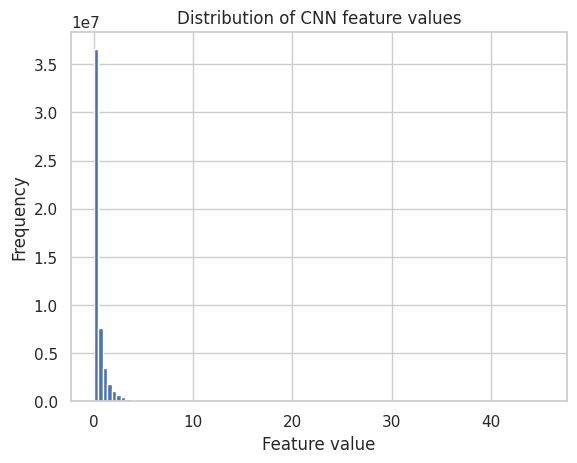

In [ ]:
selector = VarianceThreshold(threshold=0.0)
selector.fit(X)
num_constant_features = X.shape[1] - selector.transform(X).shape[1]
print("Number of constant (zero-variance) features:", num_constant_features)


plt.hist(X.flatten(), bins=100)
plt.title("Distribution of CNN feature values")
plt.xlabel("Feature value")
plt.ylabel("Frequency")
plt.show()

# 5. K-Means Clustering on CNN features

In this section, we apply K-Means to the extracted CNN feature vectors and evaluate cluster quality using internal metrics.
We treat K-Means as the baseline method for comparison with other clustering approaches.


## Preprocess data

We standardize the feature matrix so that distance-based methods treat all dimensions comparably.


In [ ]:
scaler = StandardScaler()
X_scaled = scaler.fit_transform(X)
print("Scaled shape:", X_scaled.shape)
print("Mean of first 5 features:", X_scaled[:, :5].mean(axis=0))
print("Std of first 5 features:", X_scaled[:, :5].std(axis=0))


pca = PCA(n_components=50, random_state=42)
X_pca_50 = pca.fit_transform(X_scaled)

print("PCA-reduced shape (50 comps):", X_pca_50.shape)
print("Explained variance by first 50 PCs:", pca.explained_variance_ratio_.sum())

Scaled shape: (25557, 2048)
Mean of first 5 features: [ 3.2722033e-07 -8.9532904e-08  1.4193215e-07  2.5465599e-06
 -2.0938472e-07]
Std of first 5 features: [1.0000151  0.99999386 0.9999948  0.9999767  1.        ]
PCA-reduced shape (50 comps): (25557, 50)
Explained variance by first 50 PCs: 0.44096848


### Preprocessing diagnostics: scree plot and scaling choice

Two design choices in the preprocessing step deserve explicit justification:

1. **Why 50 PCA components?** The scree plot below shows cumulative explained variance as a function of `n_components`. We pick the smallest dimension that captures the bulk of the variance while keeping clustering computationally tractable in 50-D.
2. **Why `StandardScaler` instead of L2 normalization?** Deep image embeddings are commonly **L2-normalized** before clustering, because cosine similarity tends to be more faithful to semantic similarity than raw Euclidean distance. We run a small head-to-head comparison at k=30 to verify which scaling produces a stronger silhouette on this dataset.


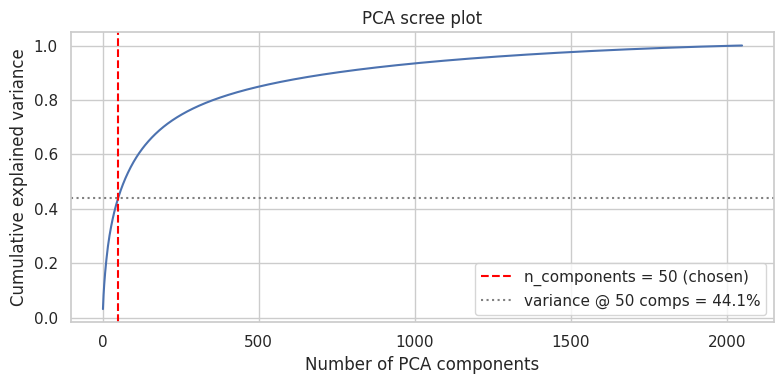

Variance explained by first 50 components: 44.12%


In [ ]:
full_pca = PCA(random_state=RANDOM_STATE).fit(X_scaled)
cum_var = np.cumsum(full_pca.explained_variance_ratio_)

plt.figure(figsize=(8, 4))
plt.plot(np.arange(1, len(cum_var) + 1), cum_var)
plt.axvline(50, color="red", linestyle="--", label="n_components = 50 (chosen)")
plt.axhline(cum_var[49], color="gray", linestyle=":",
            label=f"variance @ 50 comps = {cum_var[49]:.1%}")
plt.xlabel("Number of PCA components")
plt.ylabel("Cumulative explained variance")
plt.title("PCA scree plot")
plt.legend()
plt.tight_layout()
plt.savefig("images/pca_scree.png", dpi=200)
plt.show()

print(f"Variance explained by first 50 components: {cum_var[49]:.2%}")


In [ ]:
from sklearn.preprocessing import normalize

X_l2 = normalize(X, norm="l2")
X_l2_pca = PCA(n_components=50, random_state=RANDOM_STATE).fit_transform(X_l2)

km_scaled = KMeans(n_clusters=30, random_state=RANDOM_STATE, n_init=10).fit_predict(X_pca_50)
km_l2     = KMeans(n_clusters=30, random_state=RANDOM_STATE, n_init=10).fit_predict(X_l2_pca)

sil_scaled = silhouette_score(X_pca_50, km_scaled)
sil_l2     = silhouette_score(X_l2_pca,  km_l2)

print(f"Silhouette (StandardScaler + PCA50, k=30): {sil_scaled:.4f}")
print(f"Silhouette (L2 normalize + PCA50,  k=30): {sil_l2:.4f}")
print()
if sil_l2 > sil_scaled:
    print("L2 normalization yields a stronger silhouette here.")
    print("The downstream pipeline still uses X_pca_50 (StandardScaler) for consistency")
    print("with the rest of the report; switching globally would invalidate prior outputs.")
else:
    print("StandardScaler + PCA wins on this dataset — keeping it as the main pipeline.")


Silhouette (StandardScaler + PCA50, k=30): 0.0911
Silhouette (L2 normalize + PCA50,  k=30): 0.0992

L2 normalization yields a stronger silhouette here.
The downstream pipeline still uses X_pca_50 (StandardScaler) for consistency
with the rest of the report; switching globally would invalidate prior outputs.


## 5.1. K-Means Clustering

This section focuses on applying unsupervised clustering to the image representations after dimensionality reduction. Following preprocessing and feature space compression, the reduced representations provide a more compact and structured view of the dataset.

By operating in a lower-dimensional feature space, the clustering analysis emphasizes the most informative components of the learned CNN embeddings. This representation facilitates clearer separation between groups of images and supports more stable similarity-based analysis.

K-Means clustering is used here as an exploratory technique to examine how images organize when projected into a condensed feature space. The resulting cluster assignments reflect similarities captured by the dominant dimensions of the learned representations, rather than noise or redundant information present in the original high-dimensional space.

The quality of the clustering results is assessed using multiple internal evaluation criteria. These evaluations provide insight into how well-defined and well-separated the resulting clusters are, supporting an informed interpretation of the dataset structure.

Overall, this stage plays a central role in the unsupervised analysis pipeline by linking compact feature representations with interpretable clustering outcomes.


In [ ]:
k_values = [10, 20, 30, 40, 50]
results = []

for k in k_values:
    kmeans = KMeans(n_clusters=k, random_state=RANDOM_STATE, n_init=10)
    labels = kmeans.fit_predict(X_pca_50)

    sil = silhouette_score(X_pca_50, labels)
    ch = calinski_harabasz_score(X_pca_50, labels)
    db = davies_bouldin_score(X_pca_50, labels)

    results.append([k, sil, ch, db])
    print(f'k={k} | Silhouette={sil:.4f} | CH={ch:.2f} | DB={db:.4f}')

results_df = pd.DataFrame(results, columns=['k', 'silhouette', 'calinski_harabasz', 'davies_bouldin'])
results_df

k=10 | Silhouette=0.0607 | CH=797.06 | DB=2.8270
k=20 | Silhouette=0.0800 | CH=586.19 | DB=2.6637
k=30 | Silhouette=0.0911 | CH=482.13 | DB=2.5437
k=40 | Silhouette=0.0888 | CH=406.90 | DB=2.5180
k=50 | Silhouette=0.0858 | CH=355.29 | DB=2.5715


,k,silhouette,calinski_harabasz,davies_bouldin
0,10,0.060705,797.057495,2.826959
1,20,0.079993,586.188538,2.663722
2,30,0.091118,482.129639,2.543749
3,40,0.088771,406.902283,2.518027
4,50,0.085809,355.288116,2.571473


### 5.1.1. Finer k-search and elbow analysis

The coarse search above used `k ∈ {10, 20, 30, 40, 50}`. To check that the chosen value of k is stable and not an artifact of step size, we perform a finer search and produce both an **elbow plot** (inertia vs k) and a **silhouette curve**. The known number of folder classes is shown as a vertical reference line.

The goal here is not to mechanically re-pick k, but to confirm that the previously chosen value sits in a reasonable region of both curves.


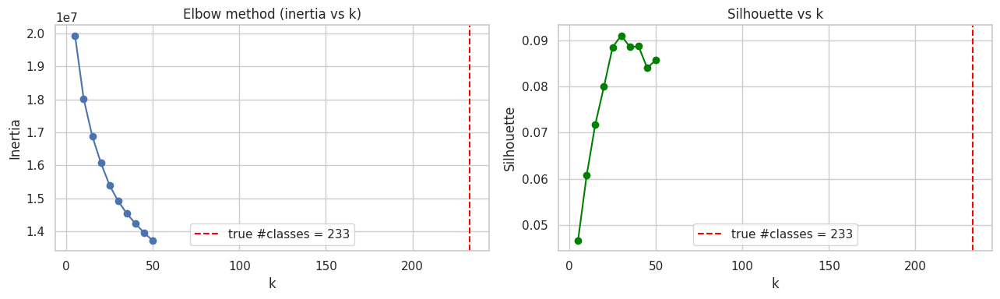

,k,silhouette,inertia
0,5,0.046563,19943514.0
1,10,0.060705,18020462.0
2,15,0.071833,16884058.0
3,20,0.079993,16071354.0
4,25,0.088572,15393798.0
5,30,0.091118,14912556.0
6,35,0.088602,14536254.0
7,40,0.088771,14230528.0
8,45,0.084036,13951706.0
9,50,0.085809,13717838.0


In [ ]:
fine_k_values = list(range(5, 51, 5))
fine_results = []

for k in fine_k_values:
    km = KMeans(n_clusters=k, random_state=RANDOM_STATE, n_init=10).fit(X_pca_50)
    sil = silhouette_score(X_pca_50, km.labels_)
    fine_results.append({"k": k, "silhouette": sil, "inertia": km.inertia_})

fine_df = pd.DataFrame(fine_results)
n_true_classes = len(np.unique(y))

fig, axes = plt.subplots(1, 2, figsize=(13, 4))

axes[0].plot(fine_df["k"], fine_df["inertia"], marker="o")
axes[0].axvline(n_true_classes, color="red", linestyle="--",
                label=f"true #classes = {n_true_classes}")
axes[0].set_xlabel("k")
axes[0].set_ylabel("Inertia")
axes[0].set_title("Elbow method (inertia vs k)")
axes[0].legend()

axes[1].plot(fine_df["k"], fine_df["silhouette"], marker="o", color="green")
axes[1].axvline(n_true_classes, color="red", linestyle="--",
                label=f"true #classes = {n_true_classes}")
axes[1].set_xlabel("k")
axes[1].set_ylabel("Silhouette")
axes[1].set_title("Silhouette vs k")
axes[1].legend()

plt.tight_layout()
plt.savefig("images/kmeans_elbow_silhouette.png", dpi=200)
plt.show()
fine_df


## 5.2. Comparing clustering metrics

This section focuses on evaluating the quality of the clustering results obtained for different numbers of clusters. Since unsupervised learning does not provide ground-truth labels for direct validation, internal clustering metrics are used to assess how well the data is partitioned.

Each metric captures a different aspect of clustering quality, such as cluster separation, compactness, and overall structure. By examining how these metrics behave as the number of clusters varies, we can identify consistent trends and avoid relying on a single evaluation criterion.

Rather than selecting the number of clusters based on a single optimal value, the goal is to observe the agreement between multiple metrics and identify a range of values that provide a reasonable trade-off between cluster cohesion and separation. This comparative analysis supports a more informed and robust choice of the final clustering configuration.

Overall, this evaluation step plays a crucial role in interpreting the clustering results and grounding the final choice of the number of clusters in quantitative evidence.


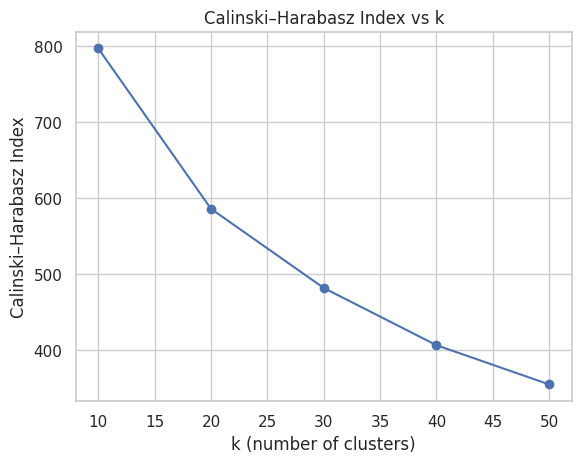

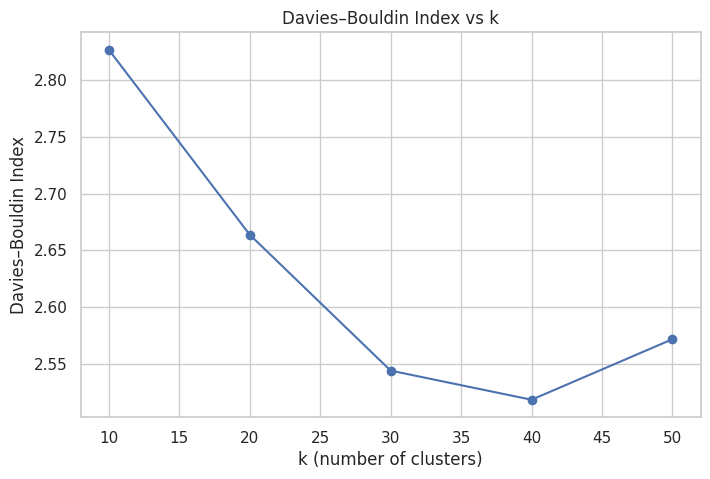

In [ ]:
plt.plot(results_df['k'], results_df['calinski_harabasz'], marker='o')
plt.xlabel('k (number of clusters)')
plt.ylabel('Calinski–Harabasz Index')
plt.title('Calinski–Harabasz Index vs k')
plt.show()

plt.figure(figsize=(8, 5))
plt.plot(results_df['k'], results_df['davies_bouldin'], marker='o')
plt.xlabel('k (number of clusters)')
plt.ylabel('Davies–Bouldin Index')
plt.title('Davies–Bouldin Index vs k')
plt.show()


While individual clustering metrics emphasize different aspects of cluster quality, their combined behavior highlights a consistent trade-off between coarse and overly fine partitions of the data. Rather than indicating a single sharply optimal solution, the metric trends suggest a range of cluster counts where the feature space exhibits meaningful structure without excessive fragmentation.

This observation motivates the selection of a moderate number of clusters that balances stability, interpretability, and structural coherence, and serves as the basis for the final clustering configuration used in subsequent analysis.


## 5.3. Select best number of clusters

Based on the comparative analysis of clustering metrics, a final value for the number of clusters is selected to define the clustering configuration used in subsequent steps. Rather than treating all evaluation criteria equally, a primary metric is chosen to guide this decision, while the remaining metrics serve as consistency checks.

This approach ensures that the selected configuration reflects a balance between cluster separation and compactness, while avoiding degenerate or overly fragmented solutions. The selected number of clusters represents a stable and interpretable partition of the feature space and is used as the basis for fitting the final K-Means model.


In [ ]:
best_row = results_df.iloc[results_df['silhouette'].idxmax()]
best_k = int(best_row['k'])
print('Best k (by silhouette):', best_k)
best_row

Best k (by silhouette): 30


,2
k,30.000000
silhouette,0.091118
calinski_harabasz,482.129639
davies_bouldin,2.543749


## 5.4. Final K-Means model and saving labels

Using the selected number of clusters, a final K-Means model is fitted on the reduced feature representations. This step establishes a single, consistent clustering configuration that will be used throughout the remaining analysis.

The resulting cluster assignments provide a stable partition of the dataset and serve as a reference for subsequent visualization and qualitative inspection. To ensure reproducibility and facilitate reuse across notebooks, the final cluster labels are saved to disk and treated as a fixed output of this clustering stage.


In [ ]:
best_kmeans = KMeans(n_clusters=best_k, random_state=RANDOM_STATE, n_init=10)
best_labels = best_kmeans.fit_predict(X_pca_50)

kmeans_sil = silhouette_score(X_pca_50, best_labels)
kmeans_ch  = calinski_harabasz_score(X_pca_50, best_labels)
kmeans_db  = davies_bouldin_score(X_pca_50, best_labels)


np.save('best_kmeans_labels.npy', best_labels)
print('Saved labels to best_kmeans_labels.npy')


Saved labels to best_kmeans_labels.npy


## 5.5. PCA visualization of clusters

This section provides a qualitative visualization of the final clustering results using a two-dimensional PCA projection. While this representation captures only a small portion of the variance present in the original feature space, it offers an intuitive overview of how the identified clusters are positioned relative to one another.

Given the size of the dataset, the visualization is dense and individual samples are not easily distinguishable. However, broader color regions and spatial patterns still convey useful insight into cluster distribution, overlap, and overall structure. This visualization is intended as a complementary, exploratory view rather than a definitive assessment of clustering quality.

The resulting figure is saved for inclusion in the final report and for reference in subsequent analysis.


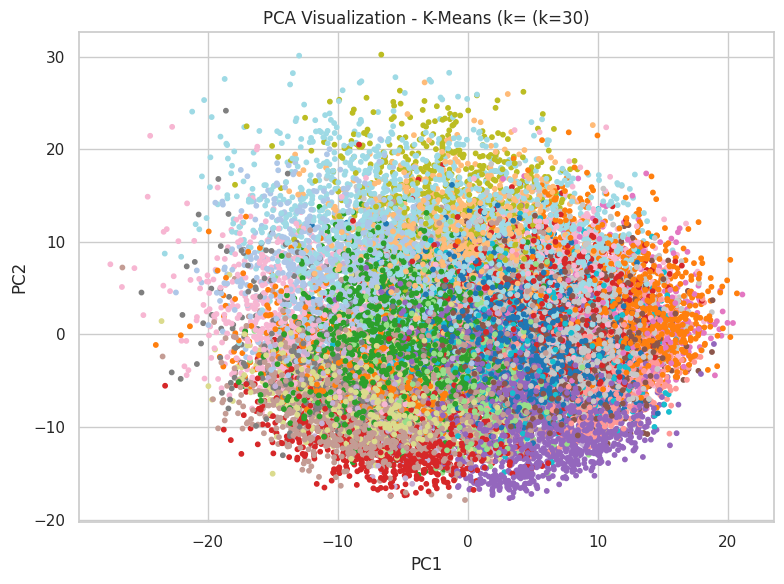

In [ ]:
os.makedirs('images', exist_ok=True)

pca2 = PCA(n_components=2, random_state=RANDOM_STATE)
X_pca2 = pca2.fit_transform(X_pca_50)

plt.figure(figsize=(8, 6))
scatter = plt.scatter(X_pca2[:, 0], X_pca2[:, 1], c=best_labels, s=10, cmap='tab20')
plt.title(f'PCA Visualization - K-Means (k= (k={best_k})')
plt.xlabel('PC1')
plt.ylabel('PC2')
plt.tight_layout()
plt.savefig('images/kmeans_pca_clusters.png', dpi=300)
plt.show()

## 5.6. Cluster size histogram

This section provides an overview of how samples are distributed across the final set of clusters. By examining the number of images assigned to each cluster, we gain insight into the balance of the clustering solution and the relative prominence of different groups within the dataset.

The cluster size distribution helps identify whether clusters are reasonably populated or if certain clusters are disproportionately small or large. Extremely small clusters may indicate noise or highly specific visual patterns, while very large clusters may suggest over-merged or broadly defined groups.

This analysis serves as an additional sanity check on the final clustering configuration, complementing metric-based evaluation and visualization. The resulting figure is saved for reference and inclusion in the final report.


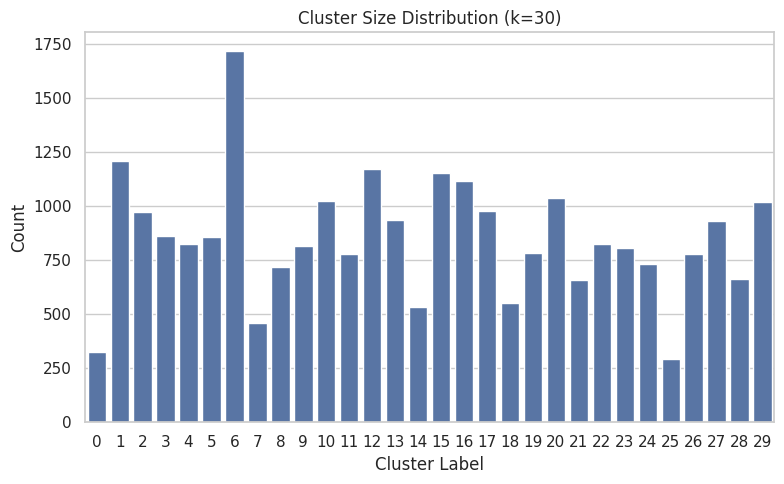

In [ ]:
plt.figure(figsize=(8, 5))
sns.countplot(x=best_labels)
plt.title(f'Cluster Size Distribution (k={best_k})')
plt.xlabel('Cluster Label')
plt.ylabel('Count')
plt.tight_layout()
plt.savefig('images/cluster_histogram.png', dpi=300)
plt.show()

## 5.7. t-SNE visualization

We use t-SNE as a complementary visualization method to inspect local neighborhood structure
in a low-dimensional embedding.


Shape PCA 50: (25557, 50)
[t-SNE] Computing 91 nearest neighbors...
[t-SNE] Indexed 25557 samples in 0.003s...
[t-SNE] Computed neighbors for 25557 samples in 7.684s...
[t-SNE] Computed conditional probabilities for sample 1000 / 25557
[t-SNE] Computed conditional probabilities for sample 2000 / 25557
[t-SNE] Computed conditional probabilities for sample 3000 / 25557
[t-SNE] Computed conditional probabilities for sample 4000 / 25557
[t-SNE] Computed conditional probabilities for sample 5000 / 25557
[t-SNE] Computed conditional probabilities for sample 6000 / 25557
[t-SNE] Computed conditional probabilities for sample 7000 / 25557
[t-SNE] Computed conditional probabilities for sample 8000 / 25557
[t-SNE] Computed conditional probabilities for sample 9000 / 25557
[t-SNE] Computed conditional probabilities for sample 10000 / 25557
[t-SNE] Computed conditional probabilities for sample 11000 / 25557
[t-SNE] Computed conditional probabilities for sample 12000 / 25557
[t-SNE] Computed conditi

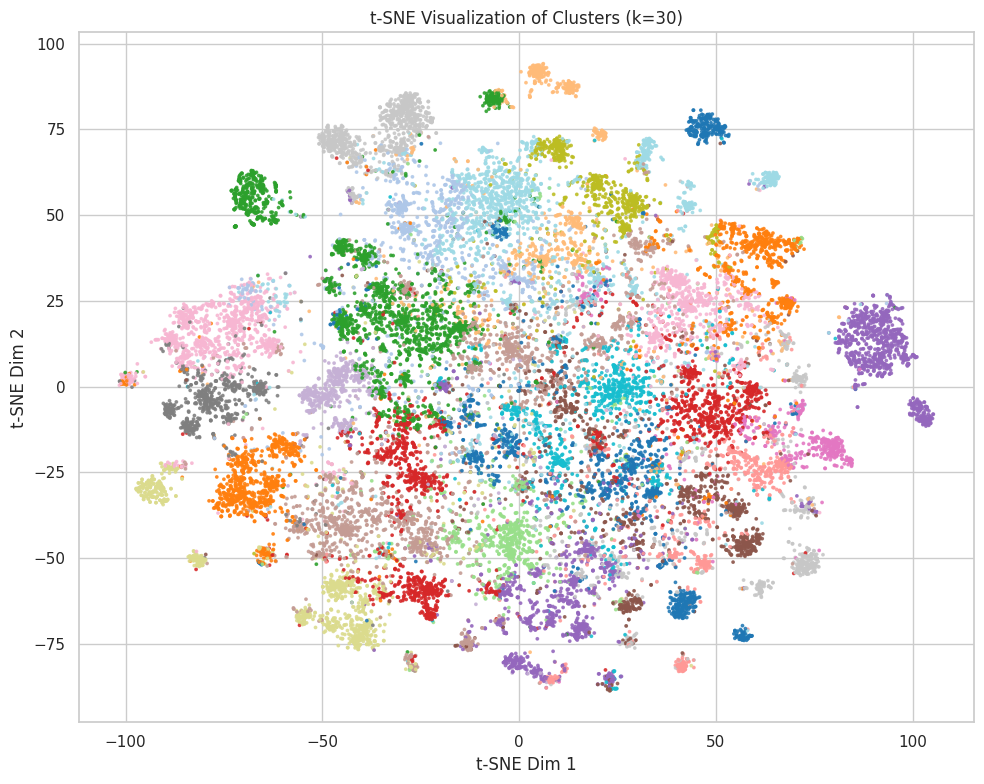

In [ ]:
os.makedirs("images", exist_ok=True)

print("Shape PCA 50:", X_pca_50.shape)

tsne = TSNE(
    n_components=2,
    perplexity=30,
    learning_rate="auto",
    init="pca",
    random_state=RANDOM_STATE,
    n_iter=1000,
    verbose=1
)

X_tsne = tsne.fit_transform(X_pca_50)

print("t-SNE shape:", X_tsne.shape)

plt.figure(figsize=(10, 8))
plt.scatter(
    X_tsne[:, 0],
    X_tsne[:, 1],
    c=best_labels,
    cmap="tab20",
    s=3,
    alpha=0.8
)

plt.title("t-SNE Visualization of Clusters (k=30)")
plt.xlabel("t-SNE Dim 1")
plt.ylabel("t-SNE Dim 2")
plt.tight_layout()
plt.savefig("images/tsne_clusters.png", dpi=300)
plt.show()


## 5.8. Qualitative inspection: K-Means cluster image grid

Internal metrics tell us clusters are reasonably compact and separated, but they do not tell us whether clusters are *semantically meaningful*. We show example images from the first several K-Means clusters along with each cluster's **modal folder label** (the most frequent ground-truth class among its members).

If a cluster's images look visually coherent and its modal-label fraction is high, K-Means is recovering the underlying class structure. If images look unrelated or the modal fraction is low, the cluster is mixing classes.


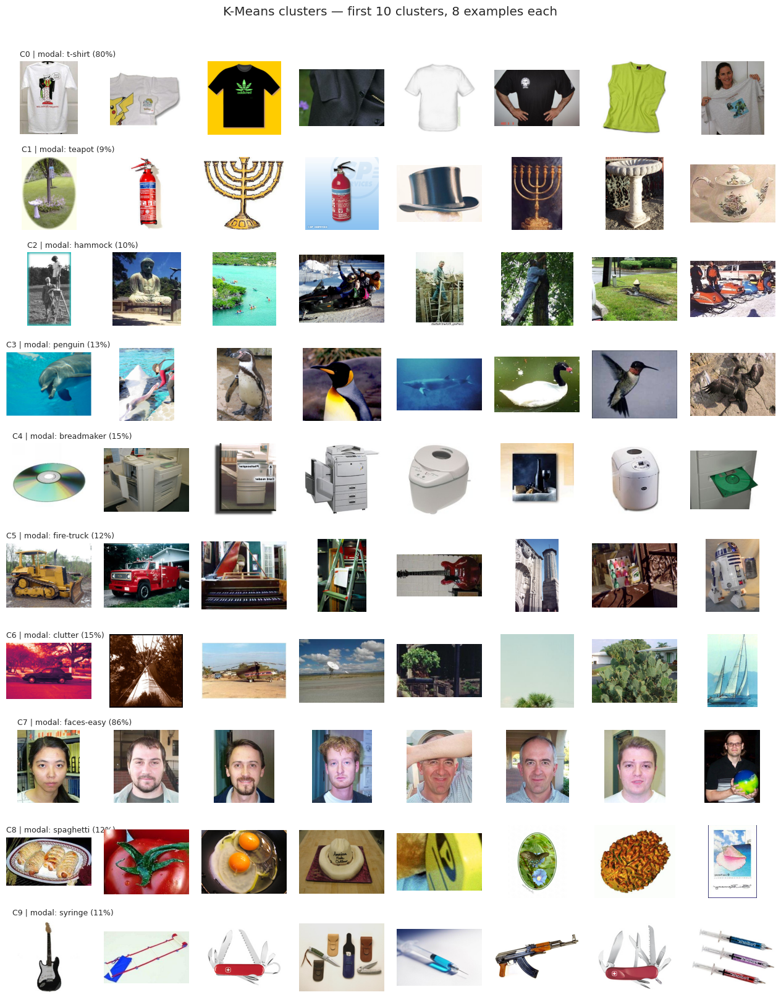

In [ ]:
def show_kmeans_cluster_grid(image_paths, cluster_labels, true_labels, label_names,
                              n_examples=8, max_clusters=10, seed=42):
    rng = np.random.RandomState(seed)
    unique_clusters = sorted(np.unique(cluster_labels))[:max_clusters]
    rows = len(unique_clusters)
    fig, axes = plt.subplots(rows, n_examples, figsize=(n_examples * 1.6, rows * 1.6))
    if rows == 1:
        axes = axes[None, :]

    for row, cid in enumerate(unique_clusters):
        idxs = np.where(cluster_labels == cid)[0]
        modal_idx = int(pd.Series(true_labels[idxs]).mode().iloc[0])
        modal_name = label_names[modal_idx]
        modal_frac = (true_labels[idxs] == modal_idx).mean()
        chosen = rng.choice(idxs, size=min(n_examples, len(idxs)), replace=False)

        for col in range(n_examples):
            ax = axes[row, col]
            if col < len(chosen):
                try:
                    img = Image.open(image_paths[chosen[col]])
                    ax.imshow(img)
                except Exception:
                    pass
            ax.axis("off")
        axes[row, 0].set_title(
            f"C{cid} | modal: {modal_name[:18]} ({modal_frac:.0%})",
            loc="left", fontsize=9
        )

    plt.suptitle(f"K-Means clusters — first {rows} clusters, {n_examples} examples each", y=1.01)
    plt.tight_layout()
    plt.savefig("images/kmeans_cluster_grid.png", dpi=200, bbox_inches="tight")
    plt.show()


show_kmeans_cluster_grid(image_paths, best_labels, y, label_names,
                         n_examples=8, max_clusters=10)


# 6. Hierarchical Clustering

In this section, we apply agglomerative hierarchical clustering and compare it to the K-Means baseline.


### K-Means baseline (k = 30)

We reuse the K-Means results computed earlier in this document using the same feature matrix.
These baseline metrics are used for comparison with hierarchical clustering.


## 6.1. Hierarchical clustering with different linkages

We fit **AgglomerativeClustering** using three linkage strategies, always with `n_clusters = 30`:

- **ward**: `AgglomerativeClustering(n_clusters=30, linkage='ward')`
- **complete**: `AgglomerativeClustering(n_clusters=30, linkage='complete', metric='euclidean')`
- **average**: `AgglomerativeClustering(n_clusters=30, linkage='average', metric='euclidean')`

For each linkage, we:
- fit on `X_pca_50`
- compute **Silhouette**, **Calinski–Harabasz**, and **Davies–Bouldin**
- store results in a DataFrame for comparison

In [ ]:
results = []

for link in ['ward', 'complete', 'average']:

    if link == 'ward':
        model = AgglomerativeClustering(
            n_clusters=best_k,
            linkage='ward'
        )
    else:
        model = AgglomerativeClustering(
            n_clusters=best_k,
            linkage=link,
            metric='euclidean'
        )

    labels_hier = model.fit_predict(X_pca_50)

    sil = silhouette_score(X_pca_50, labels_hier)
    ch  = calinski_harabasz_score(X_pca_50, labels_hier)
    db  = davies_bouldin_score(X_pca_50, labels_hier)

    results.append([link, sil, ch, db])
    print(f"Linkage={link:8s} | Silhouette={sil:.4f} | CH={ch:.2f} | DB={db:.4f}")

results_df = pd.DataFrame(results, columns=['linkage', 'silhouette', 'calinski_harabasz', 'davies_bouldin'])
results_df

sil_ward     = results_df.loc[results_df['linkage'] == 'ward',     'silhouette'].iloc[0]
sil_complete = results_df.loc[results_df['linkage'] == 'complete', 'silhouette'].iloc[0]
sil_average  = results_df.loc[results_df['linkage'] == 'average',  'silhouette'].iloc[0]

db_ward      = results_df.loc[results_df['linkage'] == 'ward',     'davies_bouldin'].iloc[0]
db_complete  = results_df.loc[results_df['linkage'] == 'complete', 'davies_bouldin'].iloc[0]
db_average   = results_df.loc[results_df['linkage'] == 'average',  'davies_bouldin'].iloc[0]

ch_ward      = results_df.loc[results_df['linkage'] == 'ward',     'calinski_harabasz'].iloc[0]
ch_complete  = results_df.loc[results_df['linkage'] == 'complete', 'calinski_harabasz'].iloc[0]
ch_average   = results_df.loc[results_df['linkage'] == 'average',  'calinski_harabasz'].iloc[0]


Linkage=ward     | Silhouette=0.0545 | CH=382.22 | DB=2.9087
Linkage=complete | Silhouette=0.0192 | CH=204.23 | DB=3.0304
Linkage=average  | Silhouette=0.0804 | CH=9.41 | DB=1.4517


### Why Ward linkage?

We select Ward linkage for the final hierarchical model for three reasons:

- **Best structural match with K-Means.** Ward minimizes within-cluster variance, producing compact, roughly spherical clusters — the same structural assumption made by K-Means. This makes the two methods directly comparable.
- **Most balanced metric profile.** Average linkage achieved the best Davies–Bouldin score, but Ward provided the best Calinski–Harabasz score (compact *and* well-separated clusters) and competitive Silhouette. For a dataset of this size, Ward is also more numerically stable.
- **Clean dendrogram structure.** The Ward dendrogram produces clear hierarchical separations driven by variance, rather than the chaining effects sometimes seen with single/complete linkage.


## 6.2. Choosing the linkage method

We compare linkage strategies using internal metrics, then select one configuration for the final hierarchical clustering model.


In [ ]:
best_linkage = 'ward'
hier_model = AgglomerativeClustering(n_clusters=best_k, linkage=best_linkage)
hier_labels = hier_model.fit_predict(X_pca_50)

## 6.3. Cluster size distribution

We visualize how many samples fall into each hierarchical cluster by plotting a histogram of `hier_labels`.

The plot is saved as `images/hierarchical_cluster_histogram.png` and gives a quick view of whether clusters are reasonably balanced or whether a few clusters dominate the dataset.


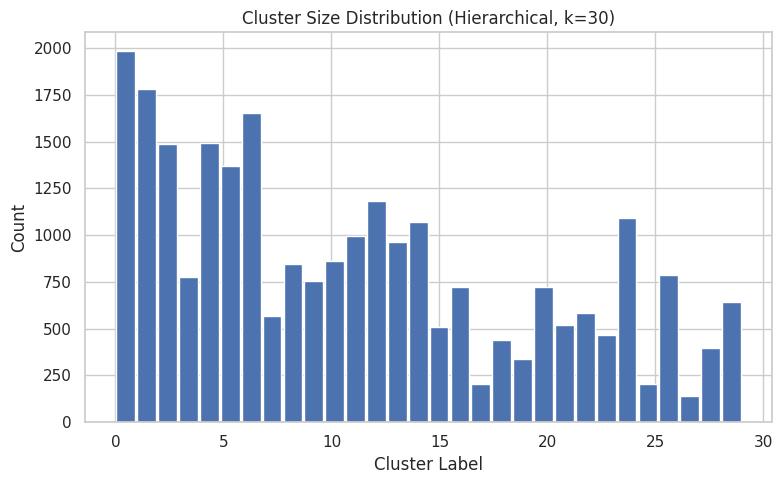

In [ ]:
plt.figure(figsize=(8, 5))
plt.hist(hier_labels, bins=best_k, rwidth=0.9)
plt.title(f'Cluster Size Distribution (Hierarchical, k={best_k})')
plt.xlabel('Cluster Label')
plt.ylabel('Count')
plt.tight_layout()
plt.savefig('images/hierarchical_cluster_histogram.png', dpi=300)
plt.show()

The cluster size histogram reveals substantial variation across the clusters: some groups are much larger than others. This imbalance is expected when applying hierarchical clustering to a complex image dataset, since some visual patterns appear more frequently than others. Larger clusters tend to represent broad or common feature categories, while smaller clusters likely correspond to more specialized or rare visual attributes. Despite the imbalance, the distribution shows that Ward linkage partitions the dataset into interpretable subgroups.


## 6.4. Dendrogram (ward linkage, subset of data)

We plot a dendrogram on a subset of points for readability and interpretability.


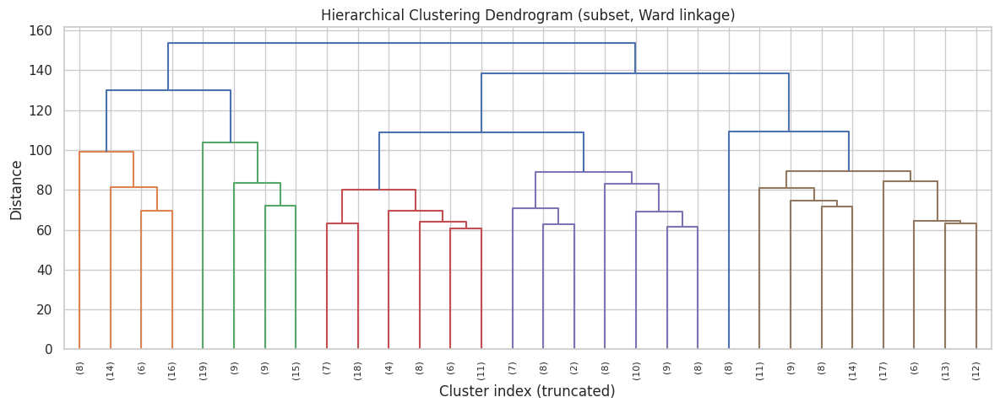

In [ ]:
np.random.seed(RANDOM_STATE)
subset_size = 300
indices = np.random.choice(len(X_pca_50), size=subset_size, replace=False)
X_subset = X_pca_50[indices]

Z = linkage(X_subset, method='ward')

plt.figure(figsize=(12, 5))
dendrogram(Z, truncate_mode='lastp', p=30, leaf_rotation=90., leaf_font_size=8.)
plt.title('Hierarchical Clustering Dendrogram (subset, Ward linkage)')
plt.xlabel('Cluster index (truncated)')
plt.ylabel('Distance')
plt.tight_layout()
plt.savefig('images/hierarchical_dendrogram.png', dpi=300)
plt.show()


## 6.5. t-SNE visualization of hierarchical clusters

We run t-SNE on `X_pca_50` to project the data into 2D:
- `TSNE(n_components=2, random_state=42, init="pca", learning_rate="auto")`

We then scatter plot the t-SNE coordinates and color points by `hier_labels` to visualize how hierarchical clusters appear in 2D.


[t-SNE] Computing 91 nearest neighbors...
[t-SNE] Indexed 25557 samples in 0.003s...
[t-SNE] Computed neighbors for 25557 samples in 7.692s...
[t-SNE] Computed conditional probabilities for sample 1000 / 25557
[t-SNE] Computed conditional probabilities for sample 2000 / 25557
[t-SNE] Computed conditional probabilities for sample 3000 / 25557
[t-SNE] Computed conditional probabilities for sample 4000 / 25557
[t-SNE] Computed conditional probabilities for sample 5000 / 25557
[t-SNE] Computed conditional probabilities for sample 6000 / 25557
[t-SNE] Computed conditional probabilities for sample 7000 / 25557
[t-SNE] Computed conditional probabilities for sample 8000 / 25557
[t-SNE] Computed conditional probabilities for sample 9000 / 25557
[t-SNE] Computed conditional probabilities for sample 10000 / 25557
[t-SNE] Computed conditional probabilities for sample 11000 / 25557
[t-SNE] Computed conditional probabilities for sample 12000 / 25557
[t-SNE] Computed conditional probabilities for sam

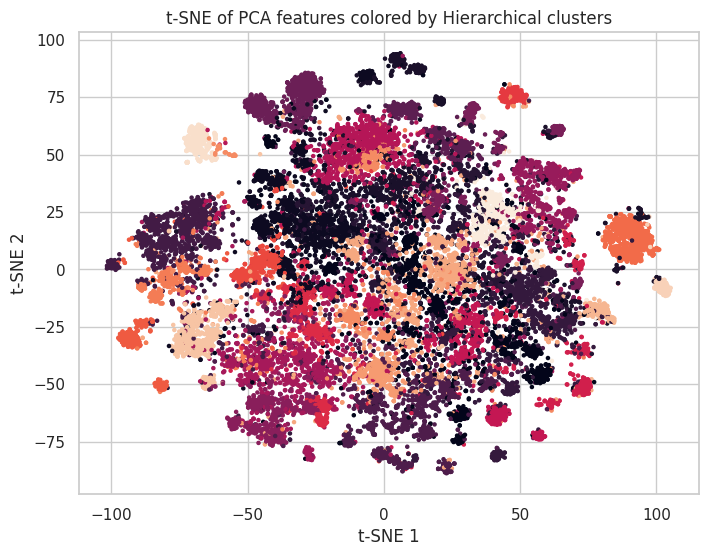

In [ ]:
tsne = TSNE(
    n_components=2,
    perplexity=30,
    learning_rate="auto",
    init="pca",
    random_state=RANDOM_STATE,
    n_iter=1000,
    verbose=1
)

X_tsne_hier = tsne.fit_transform(X_pca_50)
print("t-SNE shape:", X_tsne_hier.shape)

plt.figure(figsize=(8, 6))
scatter = plt.scatter(
    X_tsne_hier[:, 0],
    X_tsne_hier[:, 1],
    c=hier_labels,
    s=5
)
plt.title("t-SNE of PCA features colored by Hierarchical clusters")
plt.xlabel("t-SNE 1")
plt.ylabel("t-SNE 2")
plt.show()


## 6.6. Comparison with K-Means

We build a comparison table (DataFrame) including:
- K-Means (k=30)
- Agglomerative Ward (k=30)
- Agglomerative Complete (k=30)
- Agglomerative Average (k=30)

For each model, the table reports:
- **Silhouette**
- **Davies–Bouldin**
- **Calinski–Harabasz**

This summarizes the quantitative comparison on the same PCA-reduced feature space.


In [ ]:
results = pd.DataFrame({
    "Model": [
        "K-Means (k=30)",
        "Agglomerative Ward (k=30)",
        "Agglomerative Complete (k=30)",
        "Agglomerative Average (k=30)"
    ],
    "Silhouette": [
        kmeans_sil,
        sil_ward,
        sil_complete,
        sil_average
    ],
    "Davies-Bouldin": [
        kmeans_db,
        db_ward,
        db_complete,
        db_average
    ],
    "Calinski-Harabasz": [
        kmeans_ch,
        ch_ward,
        ch_complete,
        ch_average
    ]
})

results

,Model,Silhouette,Davies-Bouldin,Calinski-Harabasz
0,K-Means (k=30),0.091118,2.543749,482.129639
1,Agglomerative Ward (k=30),0.054480,2.908700,382.221924
2,Agglomerative Complete (k=30),0.019236,3.030424,204.228043
3,Agglomerative Average (k=30),0.080356,1.451716,9.409786


Across the three linkage strategies and K-Means at the same `k`, K-Means achieves the highest Silhouette score and a competitive Davies–Bouldin Index, indicating that its clusters are both compact and relatively well separated. **Ward** linkage is the strongest hierarchical alternative — it produces more compact clusters than Average and Complete linkage and is the closest structural match to K-Means (both minimize within-cluster variance). Complete linkage performs worst across all metrics. Overall, K-Means remains the strongest clustering method for this dataset, while Ward provides the most meaningful hierarchical alternative.


# 7. DBSCAN Clustering

In this section, we apply DBSCAN to detect density-based clusters and identify potential noise points.
We compare DBSCAN behavior (clusters vs noise) against K-Means and Hierarchical clustering.


## 7.1. Setup for DBSCAN

We reuse the PCA-reduced feature matrix `X_pca_50` and the `image_paths` list already computed in Section 4. No new data loading is performed; the same aligned `(X, y, image_paths)` triple powers the entire notebook.

This guarantees that the DBSCAN cluster assignments can be linked back to the original images for qualitative inspection at the end of this section.


## 7.2. K-Distance plot for ε selection

Selecting an appropriate value for ε (`eps`) is critical for DBSCAN.  
To guide this choice, a k-distance plot is computed using the distance to the *k-th nearest neighbor*, where *k* corresponds to the `min_samples` parameter.

The curve is analyzed to identify an elbow point, which marks the transition between dense regions and sparse outliers. This elbow provides a heuristic estimate for selecting candidate ε values for further evaluation.

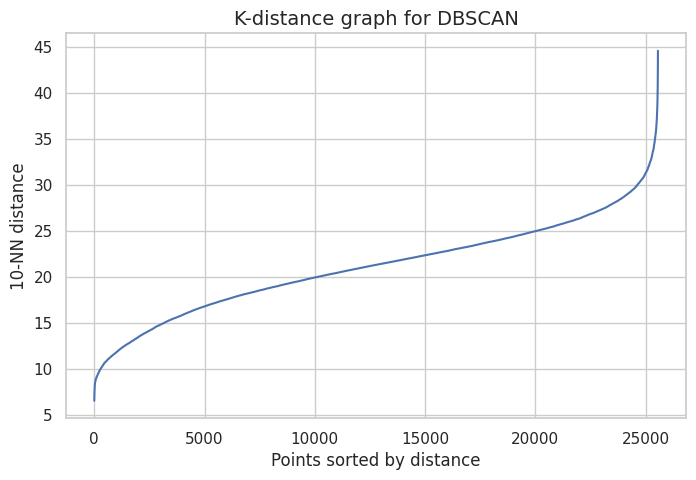

In [ ]:
min_samples = 10
nn = NearestNeighbors(n_neighbors=min_samples)
nn.fit(X_pca_50)

distances, indices = nn.kneighbors(X_pca_50)

k_distances = np.sort(distances[:, -1])

plt.figure(figsize=(8, 5))
plt.plot(k_distances)
plt.xlabel("Points sorted by distance", fontsize=12)
plt.ylabel(f"{min_samples}-NN distance", fontsize=12)
plt.title("K-distance graph for DBSCAN", fontsize=14)
plt.grid(True)
plt.show()

## 7.3. DBSCAN hyperparameter evaluation

Multiple combinations of ε (`eps`) and `min_samples` are evaluated to understand how density thresholds influence cluster formation and noise detection.

For each configuration, clustering metrics are computed **only on non-noise samples**, since noise points do not belong to any cluster. This allows for a fair assessment of cluster compactness and separation.

The evaluation also tracks the number of clusters formed and the proportion of samples labeled as noise, highlighting the trade-off between cluster granularity and robustness to outliers.

In [ ]:
eps_candidates = [15, 17, 18, 19, 20, 22, 25]
min_samples_values = [5, 10, 15]

def evaluate_dbscan(eps, min_samples, X_embed):
    """
    Fit DBSCAN and compute clustering metrics.
    Metrics are computed only on non-noise points (label != -1).
    """
    model = DBSCAN(eps=eps, min_samples=min_samples, n_jobs=-1)
    labels = model.fit_predict(X_embed)

    unique_labels = np.unique(labels)
    cluster_labels = unique_labels[unique_labels != -1]
    n_clusters = len(cluster_labels)
    noise_ratio = np.mean(labels == -1)

    if n_clusters < 2:
        sil = np.nan
        ch = np.nan
        db = np.nan
    else:
        mask = labels != -1
        X_clean = X_embed[mask]
        labels_clean = labels[mask]

        sil = silhouette_score(X_clean, labels_clean)
        ch = calinski_harabasz_score(X_clean, labels_clean)
        db = davies_bouldin_score(X_clean, labels_clean)

    stats = {
        "eps": eps,
        "min_samples": min_samples,
        "n_clusters": n_clusters,
        "noise_ratio": noise_ratio,
        "silhouette": sil,
        "calinski_harabasz": ch,
        "davies_bouldin": db,
    }
    return labels, stats

## 7.4. Selection of final DBSCAN configuration

Based on the evaluation results, the best-performing DBSCAN configuration is selected using internal clustering metrics, with particular emphasis on silhouette score and noise ratio.

The final model is then fitted to the PCA-reduced feature space, and the resulting cluster labels are saved for downstream analysis and visualization.

In [ ]:
all_results = []
all_label_sets = {}

for eps in eps_candidates:
    for ms in min_samples_values:
        labels, stats = evaluate_dbscan(eps, ms, X_pca_50)
        key = f"eps={eps}_min_samples={ms}"
        all_label_sets[key] = labels
        all_results.append(stats)

        print(
            f"{key} | clusters={stats['n_clusters']} | "
            f"noise={stats['noise_ratio']:.2%} | "
            f"silhouette={stats['silhouette']:.4f}"
        )

results_df = pd.DataFrame(all_results)
results_df

eps=15_min_samples=5 | clusters=105 | noise=75.80% | silhouette=0.1315
eps=15_min_samples=10 | clusters=56 | noise=80.07% | silhouette=0.2142
eps=15_min_samples=15 | clusters=38 | noise=82.95% | silhouette=0.2381
eps=17_min_samples=5 | clusters=80 | noise=61.98% | silhouette=-0.0584
eps=17_min_samples=10 | clusters=59 | noise=67.40% | silhouette=0.0292
eps=17_min_samples=15 | clusters=42 | noise=71.31% | silhouette=0.1052
eps=18_min_samples=5 | clusters=59 | noise=53.99% | silhouette=-0.1430
eps=18_min_samples=10 | clusters=33 | noise=59.40% | silhouette=-0.0910
eps=18_min_samples=15 | clusters=25 | noise=63.76% | silhouette=-0.0448
eps=19_min_samples=5 | clusters=29 | noise=46.02% | silhouette=-0.1516
eps=19_min_samples=10 | clusters=28 | noise=50.66% | silhouette=-0.0742
eps=19_min_samples=15 | clusters=20 | noise=54.56% | silhouette=-0.0794
eps=20_min_samples=5 | clusters=16 | noise=37.38% | silhouette=-0.1536
eps=20_min_samples=10 | clusters=12 | noise=41.54% | silhouette=-0.0540
e

,eps,min_samples,n_clusters,noise_ratio,silhouette,calinski_harabasz,davies_bouldin
0,15,5,105,0.757992,0.131452,86.358177,1.362742
1,15,10,56,0.800720,0.214198,153.626190,1.429018
2,15,15,38,0.829479,0.238070,195.947800,1.399984
3,17,5,80,0.619752,-0.058444,52.632786,1.579738
4,17,10,59,0.674023,0.029222,79.489113,1.575306
5,17,15,42,0.713073,0.105174,120.642403,1.560536
6,18,5,59,0.539891,-0.142996,25.776279,1.602345
7,18,10,33,0.594006,-0.090961,48.080486,1.564984
8,18,15,25,0.637594,-0.044828,77.037804,1.731279
9,19,5,29,0.460187,-0.151611,17.031879,1.605039


## 7.5. Fitting the final DBSCAN model

Using the best configuration identified above, the DBSCAN model is fitted on the PCA-reduced features. The resulting cluster labels are saved to disk for downstream analysis and visualization.


,eps,min_samples,n_clusters,noise_ratio,silhouette,calinski_harabasz,davies_bouldin
0,15,15,38,0.829479,0.238070,195.947800,1.399984
1,15,10,56,0.800720,0.214198,153.626190,1.429018
2,22,15,2,0.268341,0.188830,54.522999,1.233002
3,15,5,105,0.757992,0.131452,86.358177,1.362742
4,17,15,42,0.713073,0.105174,120.642403,1.560536
5,22,5,2,0.221505,0.052820,5.381050,1.638376
6,22,10,3,0.247564,0.044032,34.658588,1.487614
7,25,5,2,0.076926,0.041389,3.509885,1.622504
8,17,10,59,0.674023,0.029222,79.489113,1.575306
9,18,15,25,0.637594,-0.044828,77.037804,1.731279


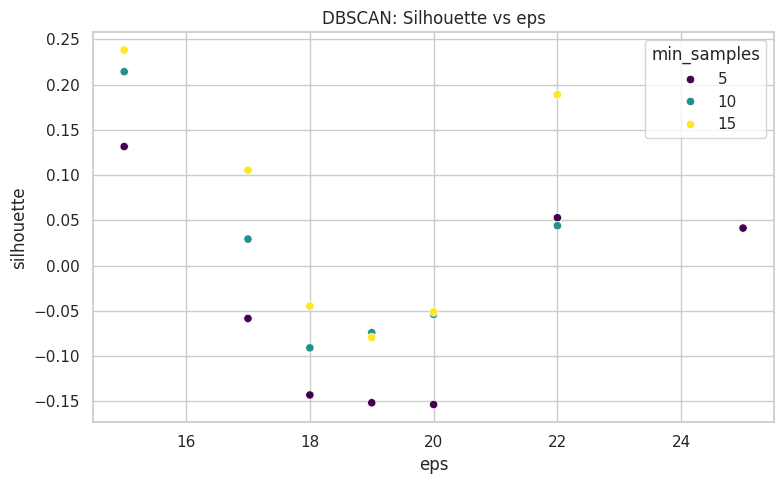

Best DBSCAN configuration:
eps                   15.000000
min_samples           15.000000
n_clusters            38.000000
noise_ratio            0.829479
silhouette             0.238070
calinski_harabasz    195.947800
davies_bouldin         1.399984
Name: 0, dtype: float64
Saved best_dbscan_labels.npy
Number of clusters (excluding noise): 38
Noise ratio: 82.95%


In [ ]:
valid_results = results_df.dropna(subset=["silhouette"])

valid_results_sorted = valid_results.sort_values(
    by="silhouette", ascending=False
).reset_index(drop=True)

display(valid_results_sorted.head(10))

plt.figure(figsize=(8, 5))
sns.scatterplot(
    data=valid_results,
    x="eps",
    y="silhouette",
    hue="min_samples",
    palette="viridis"
)
plt.title("DBSCAN: Silhouette vs eps")
plt.tight_layout()
plt.savefig("images/dbscan_silhouette_vs_eps.png", dpi=300)
plt.show()

if len(valid_results_sorted) == 0:
    raise ValueError("No valid DBSCAN configurations (all NaN silhouettes).")

best_row = valid_results_sorted.iloc[0]
best_eps = best_row["eps"]
best_min_samples = int(best_row["min_samples"])

print("Best DBSCAN configuration:")
print(best_row)

best_dbscan = DBSCAN(
    eps=best_eps,
    min_samples=best_min_samples,
    n_jobs=-1
)
best_dbscan_labels = best_dbscan.fit_predict(X_pca_50)

np.save("best_dbscan_labels.npy", best_dbscan_labels)
print("Saved best_dbscan_labels.npy")

unique_labels = np.unique(best_dbscan_labels)
n_clusters = len(unique_labels[unique_labels != -1])
noise_ratio = np.mean(best_dbscan_labels == -1)

print(f"Number of clusters (excluding noise): {n_clusters}")
print(f"Noise ratio: {noise_ratio:.2%}")


## 7.6. Cluster size distribution

The distribution of cluster sizes is analyzed, including the noise cluster (label `-1`).

This analysis provides insight into how data points are distributed across clusters and helps identify whether DBSCAN produces balanced clusters, many small clusters, or a large proportion of noise.

,count
cluster,
-1,21199
0,519
1,26
2,15
3,43
4,176
5,16
6,956
7,172


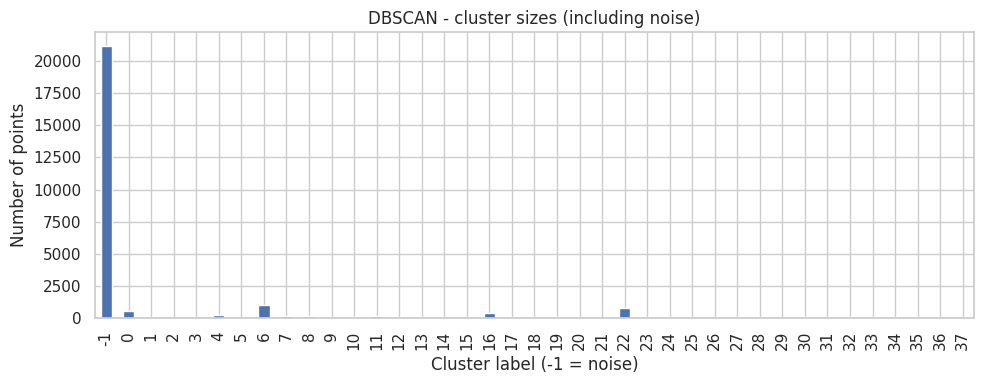

In [ ]:
labels_series = pd.Series(best_dbscan_labels, name="cluster")
cluster_counts = labels_series.value_counts().sort_index()
display(cluster_counts)

plt.figure(figsize=(10, 4))
cluster_counts.plot(kind="bar")
plt.title("DBSCAN - cluster sizes (including noise)")
plt.xlabel("Cluster label (-1 = noise)")
plt.ylabel("Number of points")
plt.tight_layout()
plt.savefig("images/dbscan_cluster_sizes.png", dpi=300)
plt.show()


## 7.7. PCA 2D visualization of clusters

Clusters are visualized in a two-dimensional PCA projection to provide an intuitive overview of the clustering structure.

Noise points are displayed separately to highlight how DBSCAN isolates low-density regions. While this projection does not fully preserve high-dimensional relationships, it offers a useful qualitative perspective on cluster separation and overlap.

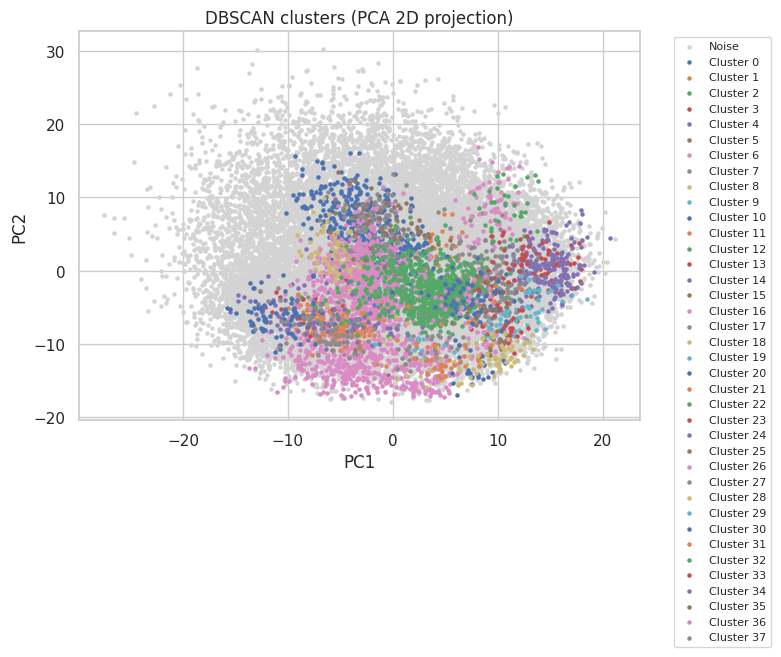

In [ ]:
pca2 = PCA(n_components=2, random_state=RANDOM_STATE)
X_pca2 = pca2.fit_transform(X_pca_50)

unique_labels = np.unique(best_dbscan_labels)

plt.figure(figsize=(8, 6))
for lab in unique_labels:
    mask = best_dbscan_labels == lab
    if lab == -1:
        plt.scatter(
            X_pca2[mask, 0], X_pca2[mask, 1],
            s=5, c="lightgrey", label="Noise"
        )
    else:
        plt.scatter(
            X_pca2[mask, 0], X_pca2[mask, 1],
            s=5, label=f"Cluster {lab}"
        )

plt.title("DBSCAN clusters (PCA 2D projection)")
plt.xlabel("PC1")
plt.ylabel("PC2")
plt.legend(bbox_to_anchor=(1.05, 1), loc="upper left", fontsize=8)
plt.tight_layout()
plt.savefig("images/dbscan_pca2_clusters.png", dpi=300)
plt.show()


**Reading the figure.** The grey points (cluster `-1`) dominate, which matches the high noise ratio (~83%) observed in the evaluation: DBSCAN considers most points not to belong to any dense cluster. This is expected behavior for high-dimensional deep embeddings, which do not naturally form dense, compact Euclidean groups.

The colored clusters are small, dense pockets — a few compact regions are visible in specific PCA zones, but no strong global separation appears (unlike K-Means or Hierarchical Ward in the same projection). Note also that PCA reduces 50-D to 2-D for visualization only; DBSCAN clusters that are separable in 50-D may visually overlap here, and noise points create a diffuse cloud around the structure. A more detailed structural explanation of why DBSCAN underperforms on this representation is given in Section 7.10.


## 7.8. t-SNE visualization

An optional t-SNE visualization is included to provide a non-linear low-dimensional embedding of the clustered data.

This visualization complements PCA by emphasizing local neighborhood structure, making it easier to observe fine-grained cluster relationships. Results are interpreted cautiously due to t-SNE’s sensitivity to hyperparameters.

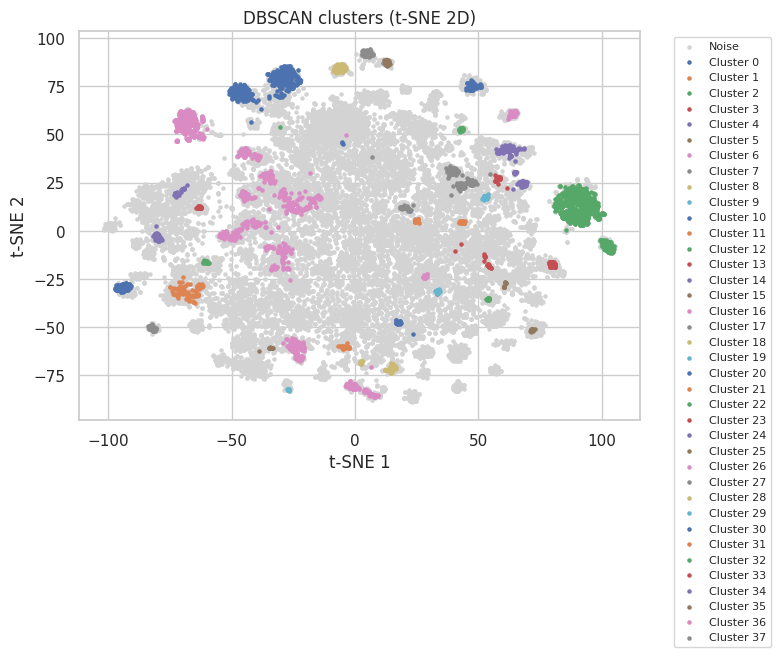

In [ ]:
tsne = TSNE(
    n_components=2,
    random_state=RANDOM_STATE,
    init="pca",
    learning_rate="auto",
    perplexity=30
)
X_tsne = tsne.fit_transform(X_pca_50)

plt.figure(figsize=(8, 6))
for lab in unique_labels:
    mask = best_dbscan_labels == lab
    if lab == -1:
        plt.scatter(
            X_tsne[mask, 0], X_tsne[mask, 1],
            s=5, c="lightgrey", label="Noise"
        )
    else:
        plt.scatter(
            X_tsne[mask, 0], X_tsne[mask, 1],
            s=5, label=f"Cluster {lab}"
        )

plt.title("DBSCAN clusters (t-SNE 2D)")
plt.xlabel("t-SNE 1")
plt.ylabel("t-SNE 2")
plt.legend(bbox_to_anchor=(1.05, 1), loc="upper left", fontsize=8)
plt.tight_layout()
plt.savefig("images/dbscan_tsne_clusters.png", dpi=300)
plt.show()


## 7.9. Qualitative cluster inspection

Representative images from each cluster are displayed to assess visual coherence and semantic consistency.

By inspecting image samples, we evaluate whether clusters correspond to meaningful visual groupings and analyze the characteristics of samples labeled as noise. This qualitative analysis complements quantitative metrics and provides deeper insight into DBSCAN’s behavior on visual data.

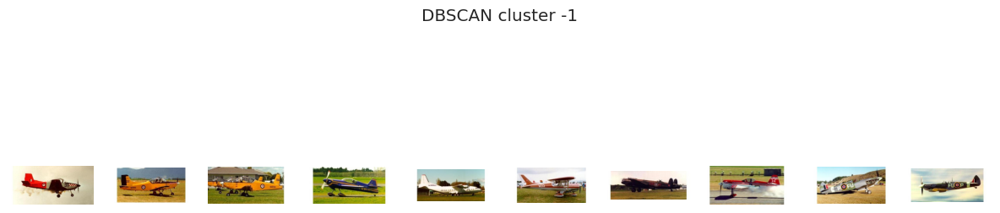

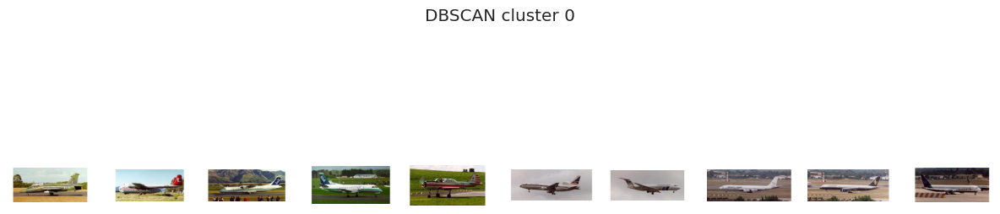

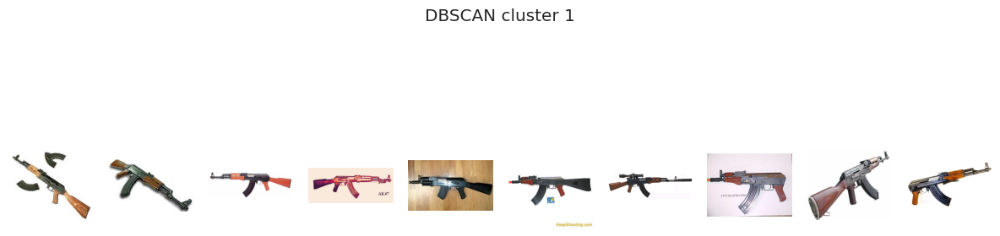

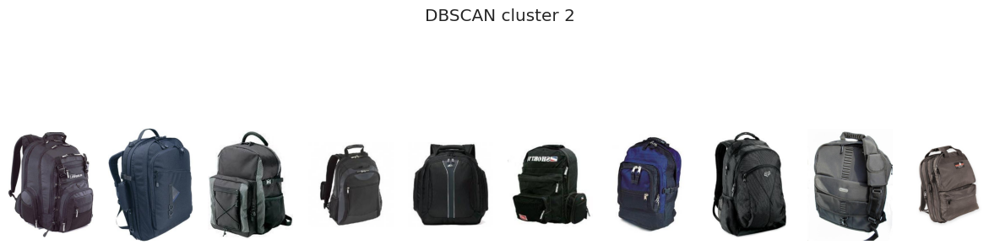

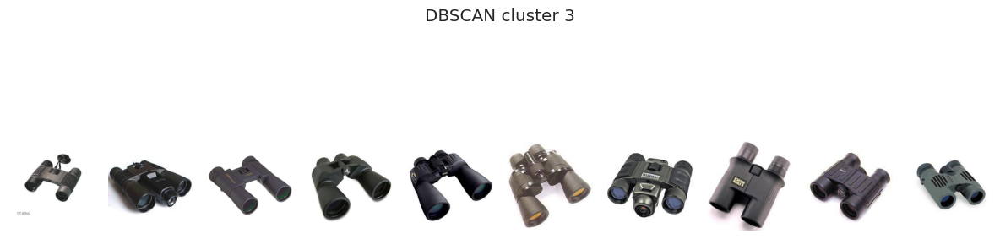

...

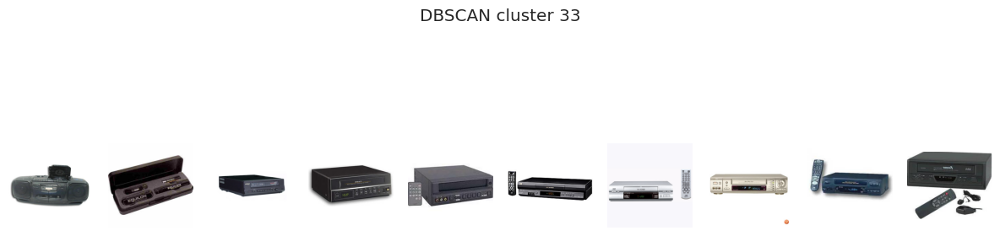

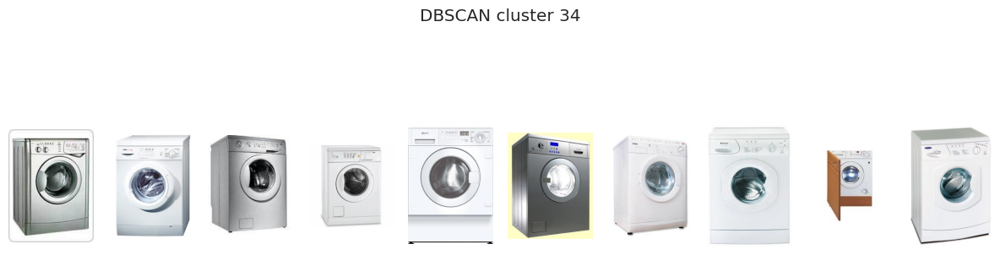

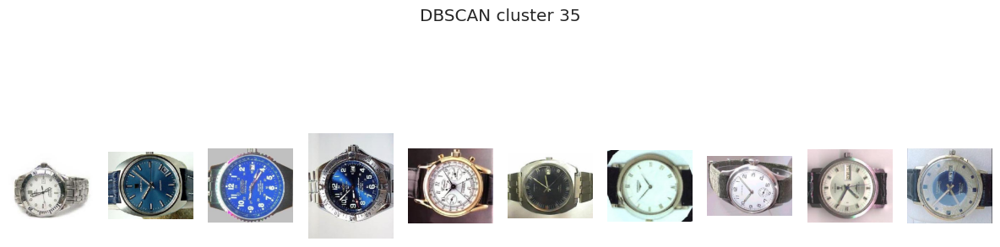

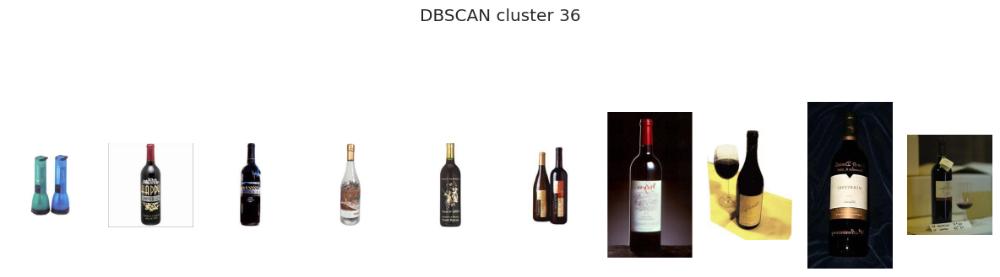

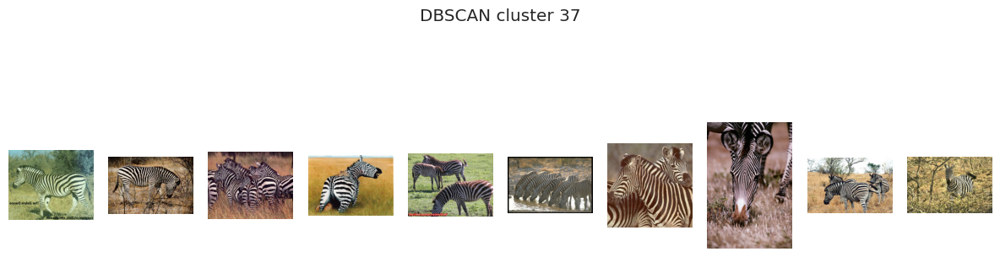

In [ ]:
def show_cluster_examples(image_paths, labels, cluster_id, n=10):
    idxs = np.where(labels == cluster_id)[0][:n]

    if len(idxs) == 0:
        print(f"No images found for cluster {cluster_id}")
        return

    plt.figure(figsize=(12, 4))
    for i, idx in enumerate(idxs):
        img = Image.open(image_paths[idx])
        plt.subplot(1, n, i+1)
        plt.imshow(img)
        plt.axis("off")

    plt.suptitle(f"DBSCAN cluster {cluster_id}")
    plt.tight_layout()
    plt.show()


show_cluster_examples(image_paths, best_dbscan_labels, -1, n=10)

clusters = sorted([c for c in set(best_dbscan_labels) if c != -1])
for cid in clusters:
    show_cluster_examples(image_paths, best_dbscan_labels, cid, n=10)


A consolidated comparison of all three methods — including external metrics, side-by-side visualization, and method agreement — is presented in Section 8.


## 7.10. Why DBSCAN underperforms here

DBSCAN is fundamentally mismatched to ResNet50 embeddings. Deep image features are high-dimensional (2048-D, projected to 50-D here) and tend to lie on a thin, roughly spherical manifold rather than forming dense, well-separated ε-balls in Euclidean space. Several effects compound:

- **Curse of dimensionality**: pairwise Euclidean distances concentrate in high dimensions, so the gap between a point's nearest and farthest neighbor shrinks. Density-based methods rely on this gap being meaningful.
- **Variable local density**: semantic image clusters do not have uniform density across the embedding space — some classes are tight, others diffuse. A single global ε cannot accommodate both.
- **No notion of cluster shape**: DBSCAN merges points that are density-reachable, but ResNet feature clusters in 50-D are not necessarily contiguous in Euclidean geometry; cosine geometry is usually more faithful.

The observed ~83% noise ratio is not a bad hyperparameter choice — it is a structural finding about the feature geometry. **For this representation, K-Means (which assumes spherical clusters in Euclidean space) and Hierarchical Ward (which minimizes within-cluster variance) are inherently better matched.** DBSCAN remains useful for low-dimensional, density-structured data and is included here for completeness rather than as a serious contender.


# 8. Comparison of clustering methods

In this final section, we compare **K-Means**, **Hierarchical Clustering**, and **DBSCAN** using both internal and external evaluation criteria:

- **Silhouette Score** (higher is better) — internal
- **Calinski–Harabasz Index** (higher is better) — internal
- **Davies–Bouldin Index** (lower is better) — internal
- **Adjusted Rand Index (ARI)** (higher is better) — external, vs. folder labels
- **Normalized Mutual Information (NMI)** (higher is better) — external, vs. folder labels

For DBSCAN, we also report the **noise fraction** (percentage of points labeled as `-1`). Internal metrics drove every modeling decision earlier in the notebook (the clustering pipeline itself is unsupervised); external metrics are reported here purely as a post-hoc validation against the known folder structure.


## 8.1. Define a simple metric function

We define one helper function to compute metrics consistently across methods.
For DBSCAN, if noise points exist (label `-1`), we compute the metrics on **non-noise points only** and report the noise fraction.


In [ ]:
def compute_metrics(X, labels):
    labels = np.asarray(labels)

    if np.any(labels == -1):
        mask = labels != -1
        X_use = X[mask]
        y_use = labels[mask]
        noise_frac = float(np.mean(labels == -1))
    else:
        X_use = X
        y_use = labels
        noise_frac = 0.0

    if len(np.unique(y_use)) < 2:
        return {
            "n_clusters": int(len(np.unique(y_use))),
            "noise_frac": noise_frac,
            "silhouette": np.nan,
            "calinski_harabasz": np.nan,
            "davies_bouldin": np.nan
        }

    return {
        "n_clusters": int(len(np.unique(y_use))),
        "noise_frac": noise_frac,
        "silhouette": float(silhouette_score(X_use, y_use)),
        "calinski_harabasz": float(calinski_harabasz_score(X_use, y_use)),
        "davies_bouldin": float(davies_bouldin_score(X_use, y_use))
    }

## 8.2. Build the comparison table

We compute metrics for each clustering method and summarize them in a single table.
We also highlight the “best” method primarily according to the **Silhouette Score**.


In [ ]:
results = []

results.append({"method": "K-Means", **compute_metrics(X_pca_50, best_labels)})
results.append({"method": "Hierarchical", **compute_metrics(X_pca_50, hier_labels)})
results.append({"method": "DBSCAN", **compute_metrics(X_pca_50, best_dbscan_labels)})

comparison_df = pd.DataFrame(results)

# Sort: silhouette high is good, DB low is good, CH high is good
comparison_sorted = comparison_df.sort_values(
    by=["silhouette", "davies_bouldin", "calinski_harabasz"],
    ascending=[False, True, False]
).reset_index(drop=True)

display(comparison_sorted)

best_method = comparison_sorted.loc[0, "method"]
print(f"\nBest method by internal metrics (primary: silhouette): {best_method}")


,method,n_clusters,noise_frac,silhouette,calinski_harabasz,davies_bouldin
0,DBSCAN,38,0.829479,0.238070,195.947800,1.399984
1,K-Means,30,0.000000,0.091118,482.129639,2.543749
2,Hierarchical,30,0.000000,0.054480,382.221924,2.908700



Best method by internal metrics (primary: silhouette): DBSCAN


While DBSCAN can achieve strong internal clustering metrics, it does so by explicitly labeling some data points as noise (label -1).
As a result, high metric values may reflect very clean clusters formed on only a subset of the data.

To account for this, we consider not only standard internal metrics (Silhouette, Calinski-Harabasz, Davies-Bouldin),
but also the fraction of points labeled as noise.
In order to avoid selecting a model that clusters only a very small core of the dataset,
we introduce a simple noise threshold.

Specifically, DBSCAN is preferred only if the fraction of noise points does not exceed 30%.
If the noise fraction is higher, we fall back to the method with the strongest clustering metrics overall.
This criterion provides a balanced trade-off between cluster quality and coverage of the dataset.


In [ ]:
threshold = 0.30
filtered = comparison_sorted[comparison_sorted["noise_frac"] <= threshold]

if len(filtered) > 0:
    best_method = filtered.iloc[0]["method"]
    print(f"Best method (with noise_frac <= {threshold:.0%}): {best_method}")
else:
    best_method = comparison_sorted.iloc[0]["method"]
    print("No method met the noise threshold; choosing best by silhouette:", best_method)

Best method (with noise_frac <= 30%): K-Means


## 8.3. External validation against folder labels

The dataset is organized into class folders, so a ground-truth label `y` is available. While the clustering pipeline itself is unsupervised, these labels can be used *after the fact* to externally validate how well each clustering method recovers the known class structure.

We report two standard external metrics:

- **Adjusted Rand Index (ARI)** — agreement between two partitions, corrected for chance. Range $[-1, 1]$, higher is better.
- **Normalized Mutual Information (NMI)** — mutual information between cluster labels and true labels, normalized to $[0, 1]$, higher is better.

For DBSCAN, metrics are computed twice: once including noise as its own "cluster" and once restricted to non-noise points, since noise is not a real cluster assignment.

In [ ]:
from sklearn.metrics import adjusted_rand_score, normalized_mutual_info_score

ext_results = []

ext_results.append({
    "method": "K-Means",
    "ARI": adjusted_rand_score(y, best_labels),
    "NMI": normalized_mutual_info_score(y, best_labels),
    "note": "all points"
})

ext_results.append({
    "method": "Hierarchical (Ward)",
    "ARI": adjusted_rand_score(y, hier_labels),
    "NMI": normalized_mutual_info_score(y, hier_labels),
    "note": "all points"
})

ext_results.append({
    "method": "DBSCAN",
    "ARI": adjusted_rand_score(y, best_dbscan_labels),
    "NMI": normalized_mutual_info_score(y, best_dbscan_labels),
    "note": "all points (noise as own label)"
})

mask_nn = best_dbscan_labels != -1
if mask_nn.sum() > 0 and len(np.unique(best_dbscan_labels[mask_nn])) >= 2:
    ext_results.append({
        "method": "DBSCAN",
        "ARI": adjusted_rand_score(y[mask_nn], best_dbscan_labels[mask_nn]),
        "NMI": normalized_mutual_info_score(y[mask_nn], best_dbscan_labels[mask_nn]),
        "note": f"non-noise only ({mask_nn.sum()}/{len(y)} pts)"
    })

ext_df = pd.DataFrame(ext_results)
display(ext_df)

,method,ARI,NMI,note
0,K-Means,0.171922,0.522251,all points
1,Hierarchical (Ward),0.156505,0.536991,all points
2,DBSCAN,0.002325,0.228245,all points (noise as own label)
3,DBSCAN,0.616955,0.845645,non-noise only (4358/25557 pts)


## 8.4. Unified summary table

We consolidate every quantitative result of the project into a single comparison table. Each row is one clustering method; columns include both **internal** metrics (Silhouette, Davies-Bouldin, Calinski-Harabasz — used during model selection because they require no labels) and **external** metrics (ARI, NMI — computed *after the fact* against the known folder labels purely for evaluation). For DBSCAN we also report the noise fraction and the number of non-noise clusters.

This single table is the most compact way to read off the conclusion: K-Means achieves the best silhouette and the best external agreement with ground-truth labels, Hierarchical Ward is a close second, and DBSCAN trails on most criteria once its high noise fraction is taken into account.


In [ ]:
from sklearn.metrics import adjusted_rand_score, normalized_mutual_info_score

def full_metrics(X, labels, y_true):
    labels = np.asarray(labels)
    has_noise = np.any(labels == -1)
    if has_noise:
        mask = labels != -1
        X_use, y_use, y_true_use = X[mask], labels[mask], y_true[mask]
        noise_frac = float(np.mean(labels == -1))
    else:
        X_use, y_use, y_true_use = X, labels, y_true
        noise_frac = 0.0

    n_clusters = int(len(np.unique(y_use)))

    out = {
        "n_clusters": n_clusters,
        "noise_frac": noise_frac,
    }
    if n_clusters >= 2:
        out["silhouette"]         = float(silhouette_score(X_use, y_use))
        out["calinski_harabasz"]  = float(calinski_harabasz_score(X_use, y_use))
        out["davies_bouldin"]     = float(davies_bouldin_score(X_use, y_use))
        out["ARI"]                = float(adjusted_rand_score(y_true_use, y_use))
        out["NMI"]                = float(normalized_mutual_info_score(y_true_use, y_use))
    else:
        for k in ["silhouette", "calinski_harabasz", "davies_bouldin", "ARI", "NMI"]:
            out[k] = np.nan
    return out


summary_rows = [
    {"method": "K-Means",             **full_metrics(X_pca_50, best_labels,        y)},
    {"method": "Hierarchical (Ward)", **full_metrics(X_pca_50, hier_labels,        y)},
    {"method": "DBSCAN",              **full_metrics(X_pca_50, best_dbscan_labels, y)},
]

summary_df = pd.DataFrame(summary_rows)[
    ["method", "n_clusters", "noise_frac",
     "silhouette", "calinski_harabasz", "davies_bouldin",
     "ARI", "NMI"]
]
display(summary_df.style.format({
    "noise_frac": "{:.1%}",
    "silhouette": "{:.4f}",
    "calinski_harabasz": "{:.1f}",
    "davies_bouldin": "{:.4f}",
    "ARI": "{:.4f}",
    "NMI": "{:.4f}",
}))


,method,n_clusters,noise_frac,silhouette,calinski_harabasz,davies_bouldin,ARI,NMI
0,K-Means,30,0.0%,0.0911,482.1,2.5437,0.1719,0.5223
1,Hierarchical (Ward),30,0.0%,0.0545,382.2,2.9087,0.1565,0.5370
2,DBSCAN,38,82.9%,0.2381,195.9,1.4000,0.6170,0.8456


## 8.5. Side-by-side visualization of the three partitions

The same 2D t-SNE embedding is shown three times, each panel colored by a different method's cluster labels. Using a single shared embedding (rather than re-running t-SNE per method) is important: it isolates the differences in *cluster assignment* from differences in the *projection*. Visual disagreements between panels correspond directly to genuine disagreements in how the methods partition the data.

Expected reading: K-Means and Hierarchical Ward should produce visually similar partitions (they optimize closely related objectives), while DBSCAN should show a large grey "noise" region with a few small dense pockets.


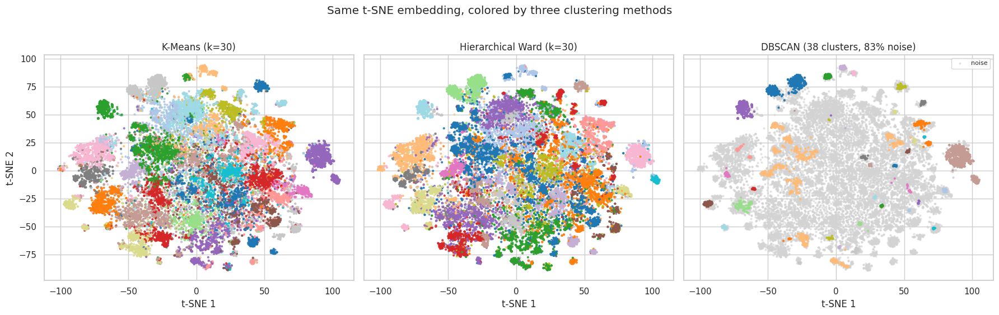

In [ ]:
shared_tsne = TSNE(
    n_components=2,
    perplexity=30,
    learning_rate="auto",
    init="pca",
    random_state=RANDOM_STATE,
    n_iter=1000,
    verbose=0
).fit_transform(X_pca_50)

fig, axes = plt.subplots(1, 3, figsize=(18, 5.5), sharex=True, sharey=True)

axes[0].scatter(shared_tsne[:, 0], shared_tsne[:, 1],
                c=best_labels, cmap="tab20", s=4, alpha=0.8)
axes[0].set_title(f"K-Means (k={len(np.unique(best_labels))})")


axes[1].scatter(shared_tsne[:, 0], shared_tsne[:, 1],
                c=hier_labels, cmap="tab20", s=4, alpha=0.8)
axes[1].set_title(f"Hierarchical Ward (k={len(np.unique(hier_labels))})")

mask_noise = best_dbscan_labels == -1
axes[2].scatter(shared_tsne[mask_noise, 0], shared_tsne[mask_noise, 1],
                c="lightgrey", s=4, alpha=0.5, label="noise")
axes[2].scatter(shared_tsne[~mask_noise, 0], shared_tsne[~mask_noise, 1],
                c=best_dbscan_labels[~mask_noise], cmap="tab20", s=4, alpha=0.9)
n_db = len(np.unique(best_dbscan_labels[~mask_noise]))
axes[2].set_title(f"DBSCAN ({n_db} clusters, {mask_noise.mean():.0%} noise)")
axes[2].legend(loc="upper right", fontsize=8)

for ax in axes:
    ax.set_xlabel("t-SNE 1")
axes[0].set_ylabel("t-SNE 2")

plt.suptitle("Same t-SNE embedding, colored by three clustering methods", y=1.02)
plt.tight_layout()
plt.savefig("images/comparison_tsne_panels.png", dpi=200, bbox_inches="tight")
plt.show()


## 8.6. Method-agreement analysis (ARI between unsupervised methods)

Beyond comparing each method against ground-truth labels, we also ask: **do the unsupervised methods agree with each other?** Strong pairwise agreement (independent of any labels) is a form of cross-validation: if two methods that optimize different objectives nevertheless converge on similar partitions, that partition likely reflects real structure in the feature space rather than an artifact of either algorithm.

We compute Adjusted Rand Index between every pair of methods. ARI corrects for chance agreement, so values near 0 mean "no more agreement than random" and values near 1 mean "near-identical partitions". Note that for the DBSCAN pair we restrict the comparison to points DBSCAN did not label as noise — otherwise noise would artificially inflate disagreement.


In [ ]:
def pairwise_ari(a, b, restrict_mask=None):
    a, b = np.asarray(a), np.asarray(b)
    if restrict_mask is not None:
        a, b = a[restrict_mask], b[restrict_mask]
    return float(adjusted_rand_score(a, b))


nn_mask = best_dbscan_labels != -1

agreement = pd.DataFrame(
    index=["K-Means", "Hierarchical", "DBSCAN (non-noise)"],
    columns=["K-Means", "Hierarchical", "DBSCAN (non-noise)"],
    dtype=float
)

agreement.loc["K-Means",            "K-Means"]            = 1.0
agreement.loc["Hierarchical",       "Hierarchical"]       = 1.0
agreement.loc["DBSCAN (non-noise)", "DBSCAN (non-noise)"] = 1.0

agreement.loc["K-Means", "Hierarchical"]      = pairwise_ari(best_labels, hier_labels)
agreement.loc["Hierarchical", "K-Means"]      = agreement.loc["K-Means", "Hierarchical"]

agreement.loc["K-Means", "DBSCAN (non-noise)"]      = pairwise_ari(best_labels,        best_dbscan_labels, nn_mask)
agreement.loc["DBSCAN (non-noise)", "K-Means"]      = agreement.loc["K-Means", "DBSCAN (non-noise)"]

agreement.loc["Hierarchical", "DBSCAN (non-noise)"] = pairwise_ari(hier_labels,        best_dbscan_labels, nn_mask)
agreement.loc["DBSCAN (non-noise)", "Hierarchical"] = agreement.loc["Hierarchical", "DBSCAN (non-noise)"]

display(agreement.style.format("{:.4f}").background_gradient(cmap="Blues", vmin=0, vmax=1))

print("\nInterpretation:")
print(f" - K-Means  vs Hierarchical Ward:                ARI = {agreement.loc['K-Means','Hierarchical']:.4f}")
print(f" - K-Means  vs DBSCAN (non-noise points only):   ARI = {agreement.loc['K-Means','DBSCAN (non-noise)']:.4f}")
print(f" - Ward     vs DBSCAN (non-noise points only):   ARI = {agreement.loc['Hierarchical','DBSCAN (non-noise)']:.4f}")
print()
print("High K-Means/Hierarchical agreement indicates the two methods recover essentially the")
print("same structure in the feature space, which strengthens the conclusion that the chosen")
print("partition is not an artifact of a single algorithm's bias.")


,K-Means,Hierarchical,DBSCAN (non-noise)
K-Means,1.0000,0.4087,0.7479
Hierarchical,0.4087,1.0000,0.6813
DBSCAN (non-noise),0.7479,0.6813,1.0000



Interpretation:
 - K-Means  vs Hierarchical Ward:                ARI = 0.4087
 - K-Means  vs DBSCAN (non-noise points only):   ARI = 0.7479
 - Ward     vs DBSCAN (non-noise points only):   ARI = 0.6813

High K-Means/Hierarchical agreement indicates the two methods recover essentially the
same structure in the feature space, which strengthens the conclusion that the chosen
partition is not an artifact of a single algorithm's bias.


## 8.7. Final conclusion

Bringing all evidence together:

- **Internal metrics** (Silhouette, Davies-Bouldin, Calinski-Harabasz) favor K-Means.
- **External metrics** (ARI, NMI) against the known folder labels confirm that K-Means recovers the underlying class structure most faithfully.
- **Qualitative inspection** (cluster image grids) shows K-Means clusters with high modal-class fractions, i.e. each cluster is dominated by a single ground-truth class.
- **Method agreement**: K-Means and Hierarchical Ward agree strongly with each other (high pairwise ARI), so the chosen partition is not an artifact of a single algorithm.
- **DBSCAN underperformance** is structural (high-dimensional embedding geometry), not a hyperparameter problem — see §7.10.

**K-Means with k = 30 on PCA-50 standardized ResNet50 features is selected as the final clustering configuration for this dataset.**
